In [1]:
%matplotlib notebook
import IPython
from IPython.display import display
import pandas as pd
import csv
from numpy import nan as NA
from datetime import datetime
import re
import sys
import numpy as np
import matplotlib.pyplot as plt 
from pandas import *
import pickle
import requests
import os
from sklearn import model_selection
from sklearn.model_selection import cross_val_score
from sklearn.metrics import classification_report
from sklearn.pipeline import Pipeline
from yellowbrick.classifier import ClassificationReport
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import LinearSVC, NuSVC, SVC
from sklearn.linear_model import LogisticRegressionCV, LogisticRegression, SGDClassifier
from sklearn.ensemble import BaggingClassifier, ExtraTreesClassifier, RandomForestClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import Normalizer
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import PassiveAggressiveClassifier
from sklearn.naive_bayes import MultinomialNB

from sklearn.neural_network import MLPClassifier

#    --------------------MODEL SELECTION---------------------------------

In this notebook we will visually study how some classifiers behave when fitted to our sets.
Here we will perform three types of anaysis:

1. Analysis with the target variable "offensegroup" y

2. Analysis with the target variable "urc-rank" z

3. Analysis with the target variable "ucr-rank" but using 3 groups instead of 9

4. Analysis with the target variable "ucr-rank" but using 2 groups and including car crimes into violent

Note that during this analysis we will choose only the most user friendly features. This is due to the fact that one of our main goals to to make the product easier to use.

In [2]:
with open('x_y_z.pickle', 'rb') as xyz:
    feat_var = pickle.load(xyz)

In [3]:
X =  feat_var[0]
y =  feat_var[1] #y is "offense group"
z =  feat_var[2] # z is "ucr-rank"

In [4]:
z_i = pd.Series(z)
z_i.value_counts()

6    102462
7     82325
4     26379
5     23033
8     22602
3     17686
2      2170
1       942
9       196
Name: ucr-rank, dtype: int64

#### choosing most user friendly features

In [147]:
print(X.columns)

Index(['NEIGHBORHOOD_CLUSTER', 'CENSUS_TRACT', 'LONGITUDE', 'SHIFT', 'YBLOCK',
       'DISTRICT', 'WARD', 'YEAR', 'sector', 'PSA', 'BLOCK_GROUP',
       'VOTING_PRECINCT', 'XBLOCK', 'BLOCK', 'ANC', 'datetime', 'location',
       'LATITUDE', 'splitted', 'startblock', 'endblock_1', 'endblock',
       'street', 'year', 'month', 'day', 'hour', 'minute', 'second', 'Year',
       'Month', 'Day', 'Hour', 'Temperature', 'Precipitation', 'Snowfall'],
      dtype='object')


# Note:

Since this is only a preliminary exploration of the models. The final product will use few features in order to improve user friendliness

In [5]:
X = X[["Hour", "SHIFT", "street", "minute", "month", "Day", "LATITUDE", "LONGITUDE", "Temperature","ANC", "PSA",
      "VOTING_PRECINCT", "BLOCK", "WARD", "datetime"]]
# ANC = 97
# BLOCK = 40 -99 block of south street nw.. important to get the block range
# Ward = 7.0
# VOTING_PRECINCT = 97
# PSA(Police Service Area) = 602.0 
# ANC(Advisory Neighborhood Commission) = 7C 
# LATITUDE = 
# LONGITUDE = round to 3 decimals
#SHIFT = midnight, evening, day
# Datetime = 2010-06-11 04:00:00 minutes and seconds set to 0....

# more info about features here : http://dcatlas.dcgis.dc.gov/mar/

## 1. Analysis with the target variable "offensegroup" y

In [6]:
X_train, X_test, y_train, y_test = model_selection.train_test_split(X, y, test_size=0.2,random_state= 0)

### 1.1 Scaling the dataset

In [7]:
scaler = StandardScaler()
#scaler =  MinMaxScaler()
#scaler = Normalizer()
X_train = scaler.fit(X_train).transform(X_train)
X_test = scaler.fit(X_test).transform(X_test)

#Note that there is no scaling in the y set. this is to prevent it to be transformed to continuous.

In [8]:
def classifier_graph(classifier):
    classes = ['Property','Violent'] # property = 0 and violent = 1
    model = classifier
    visualizer = ClassificationReport(model, classes=classes)



    visualizer.fit(X_train, y_train)  # Fit the visualizer and the model
    visualizer.score(X_test, y_test)  # Evaluate the model on the test data
    g = visualizer.poof()             # Draw/show/poof the data

In [9]:
y__ = pd.Series(y)
y__.value_counts()

0    230618
1     47177
dtype: int64

c:\users\franc\appdata\local\programs\python\python36\lib\site-packages\sklearn\linear_model\stochastic_gradient.py:128: FutureWarning: max_iter and tol parameters have been added in <class 'sklearn.linear_model.passive_aggressive.PassiveAggressiveClassifier'> in 0.19. If both are left unset, they default to max_iter=5 and tol=None. If tol is not None, max_iter defaults to max_iter=1000. From 0.21, default max_iter will be 1000, and default tol will be 1e-3.
  "and default tol will be 1e-3." % type(self), FutureWarning)


<IPython.core.display.Javascript object>


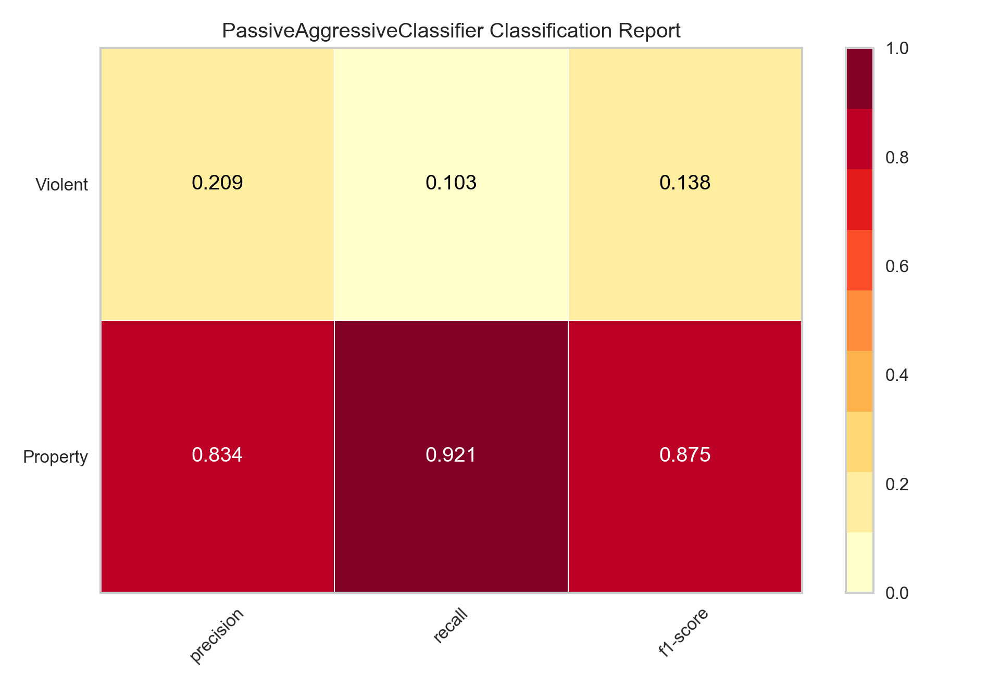

In [10]:
pa = classifier_graph(PassiveAggressiveClassifier())

<IPython.core.display.Javascript object>


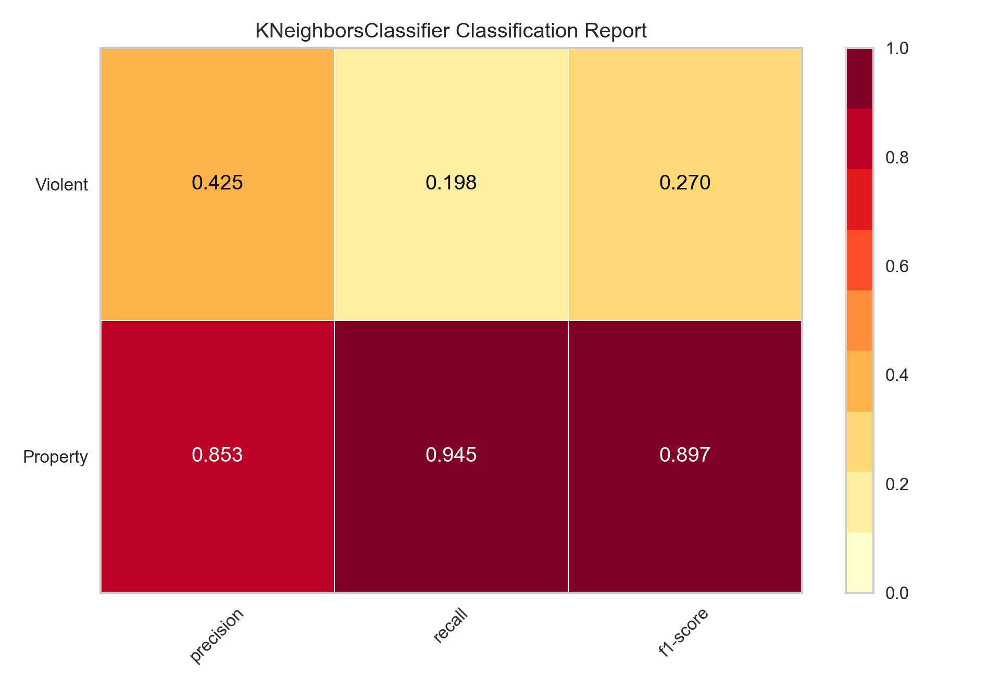

In [12]:
knn = classifier_graph(KNeighborsClassifier())

<IPython.core.display.Javascript object>


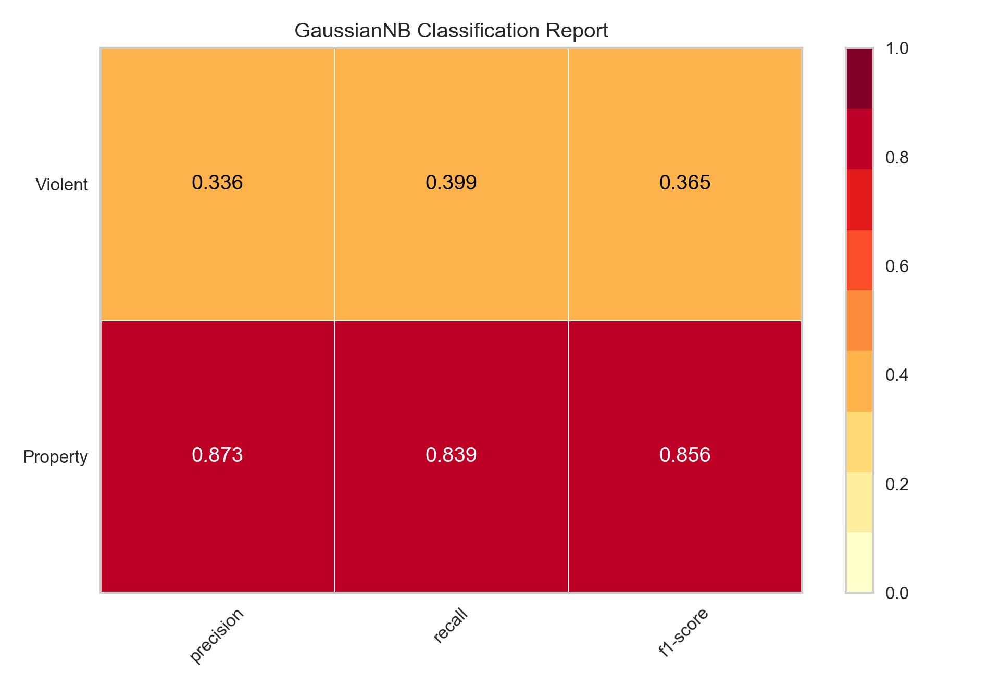

In [11]:
Naive_bayes = classifier_graph(GaussianNB())   

<IPython.core.display.Javascript object>


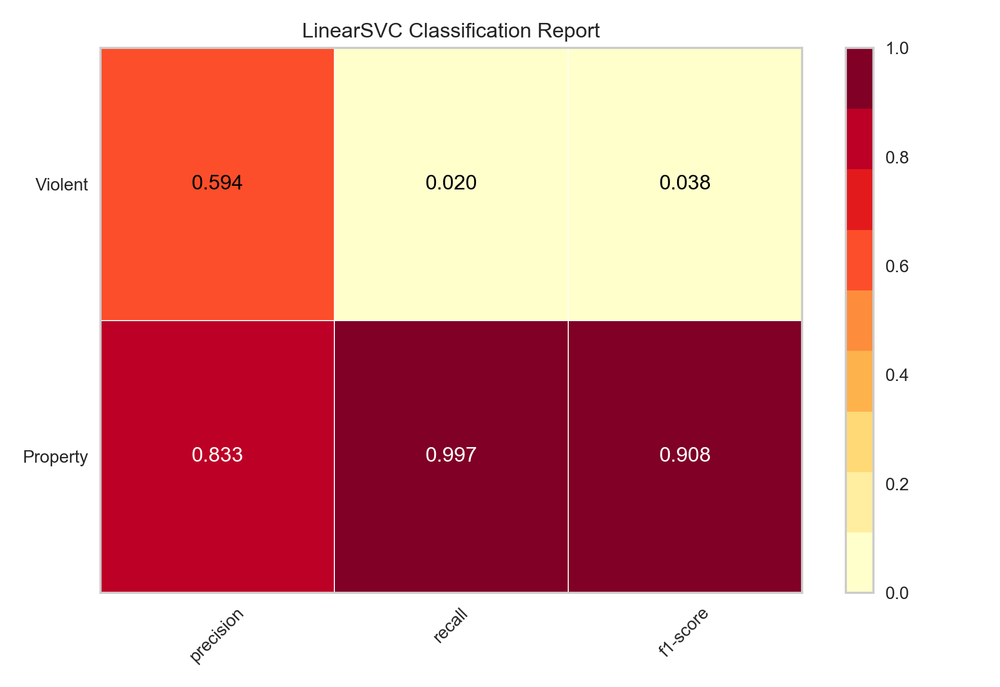

In [14]:
svc_linear = classifier_graph(LinearSVC())

<IPython.core.display.Javascript object>


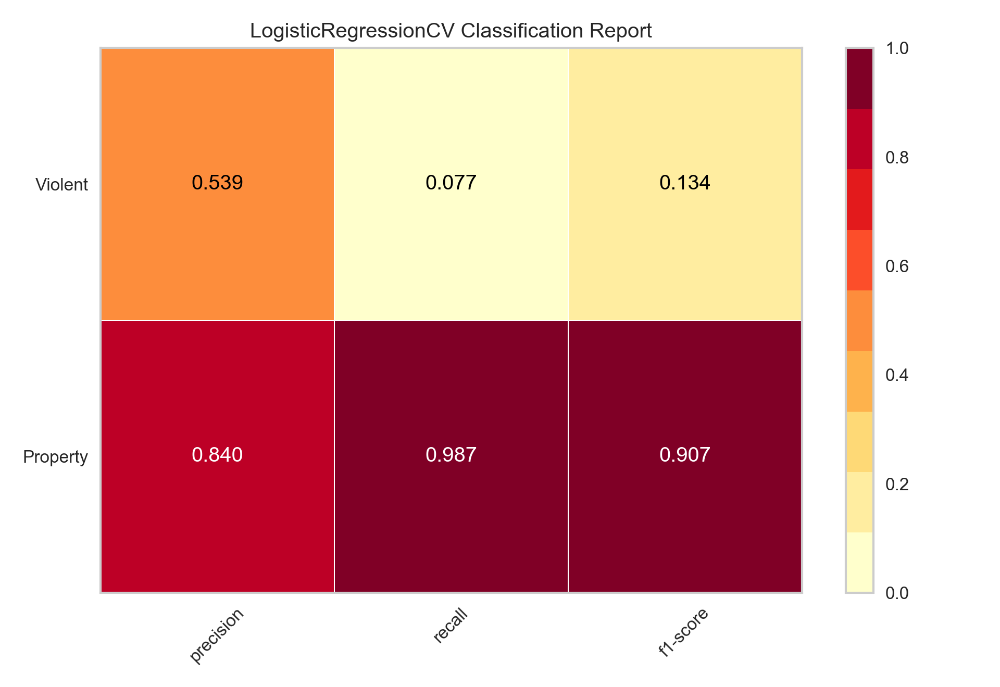

In [15]:
lgcv = classifier_graph(LogisticRegressionCV())

<IPython.core.display.Javascript object>


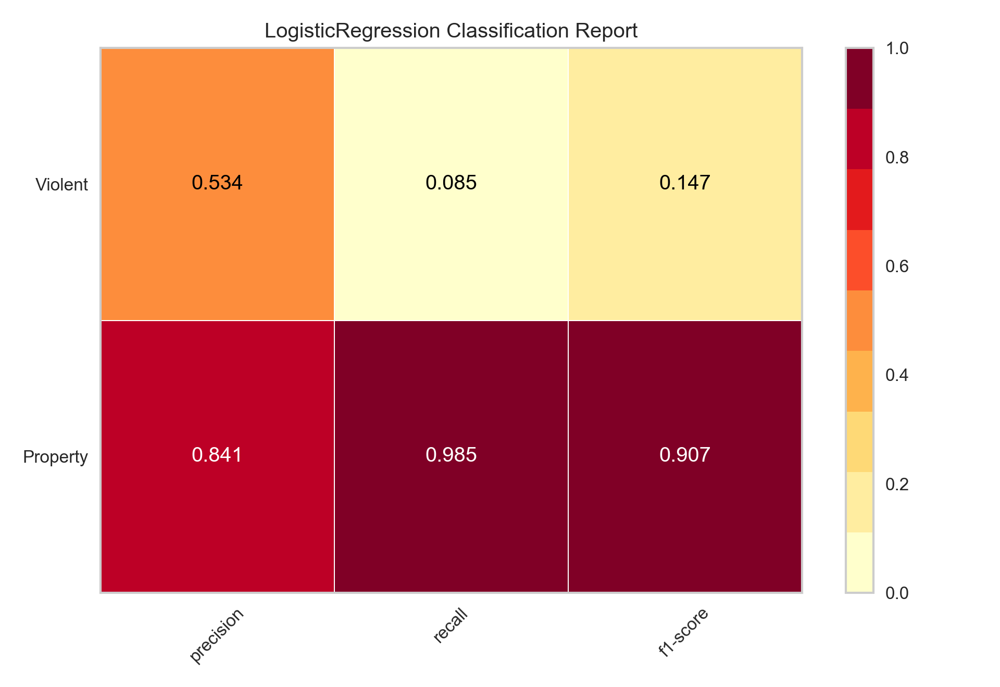

In [16]:
lg = classifier_graph(LogisticRegression())

c:\users\franc\appdata\local\programs\python\python36\lib\site-packages\sklearn\linear_model\stochastic_gradient.py:128: FutureWarning: max_iter and tol parameters have been added in <class 'sklearn.linear_model.stochastic_gradient.SGDClassifier'> in 0.19. If both are left unset, they default to max_iter=5 and tol=None. If tol is not None, max_iter defaults to max_iter=1000. From 0.21, default max_iter will be 1000, and default tol will be 1e-3.
  "and default tol will be 1e-3." % type(self), FutureWarning)
c:\users\franc\appdata\local\programs\python\python36\lib\site-packages\sklearn\metrics\classification.py:1135: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


<IPython.core.display.Javascript object>


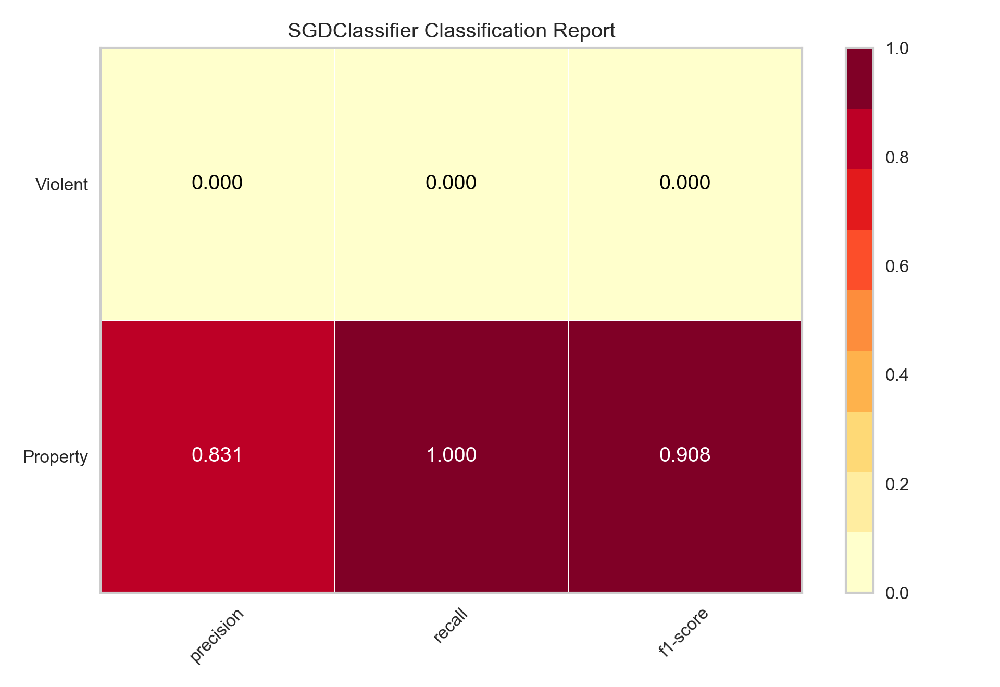

In [17]:
sgdc = classifier_graph(SGDClassifier())

<IPython.core.display.Javascript object>


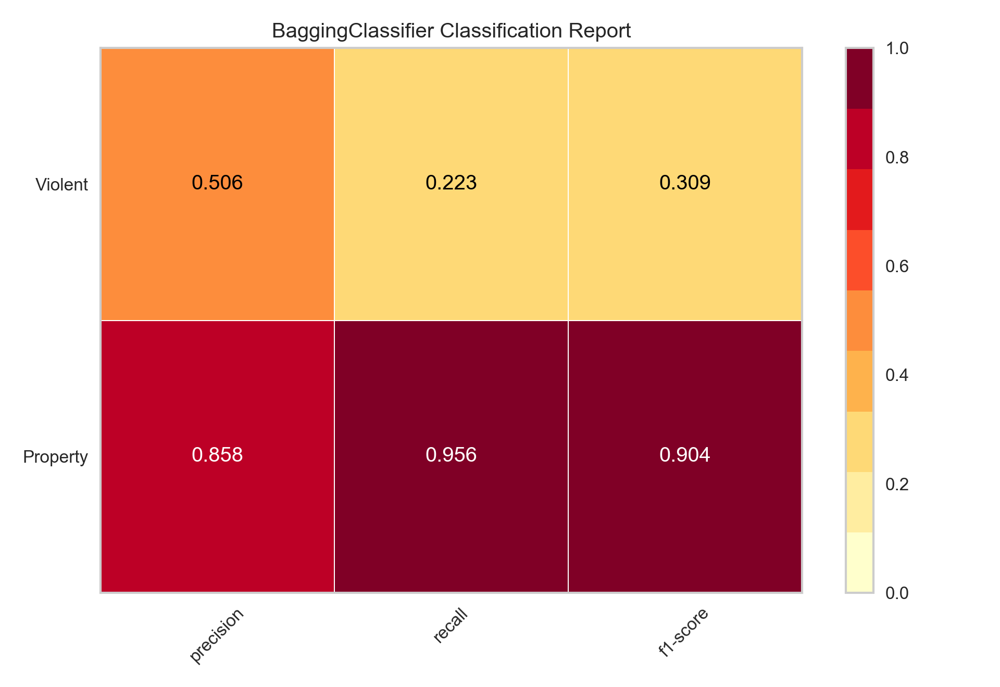

In [18]:
baggin = classifier_graph(BaggingClassifier())

<IPython.core.display.Javascript object>


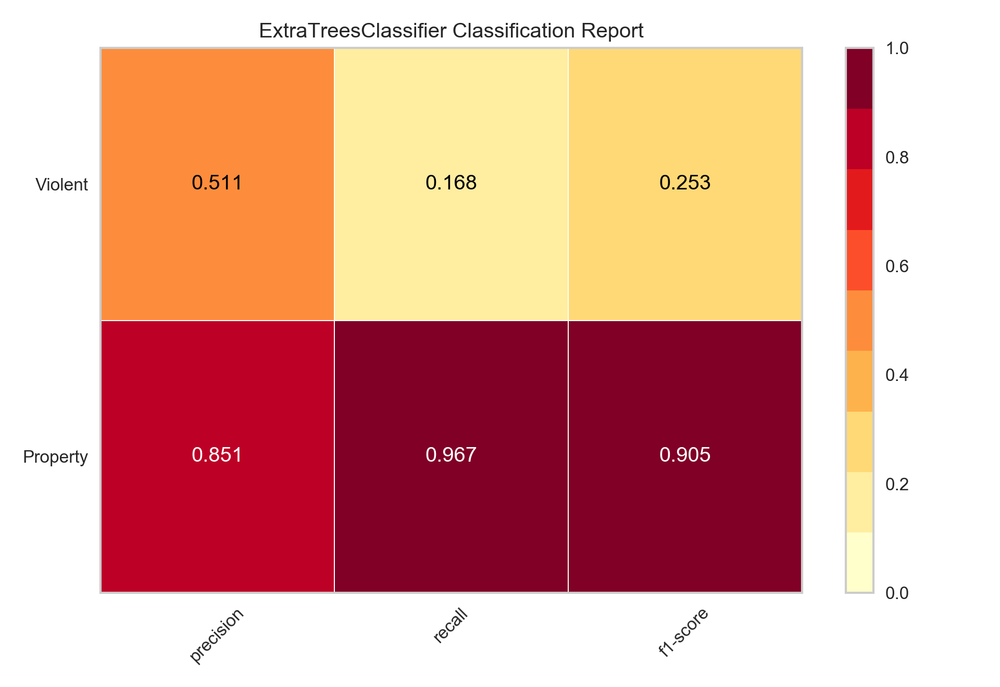

In [19]:
trees = classifier_graph(ExtraTreesClassifier(n_jobs = -1))

<IPython.core.display.Javascript object>


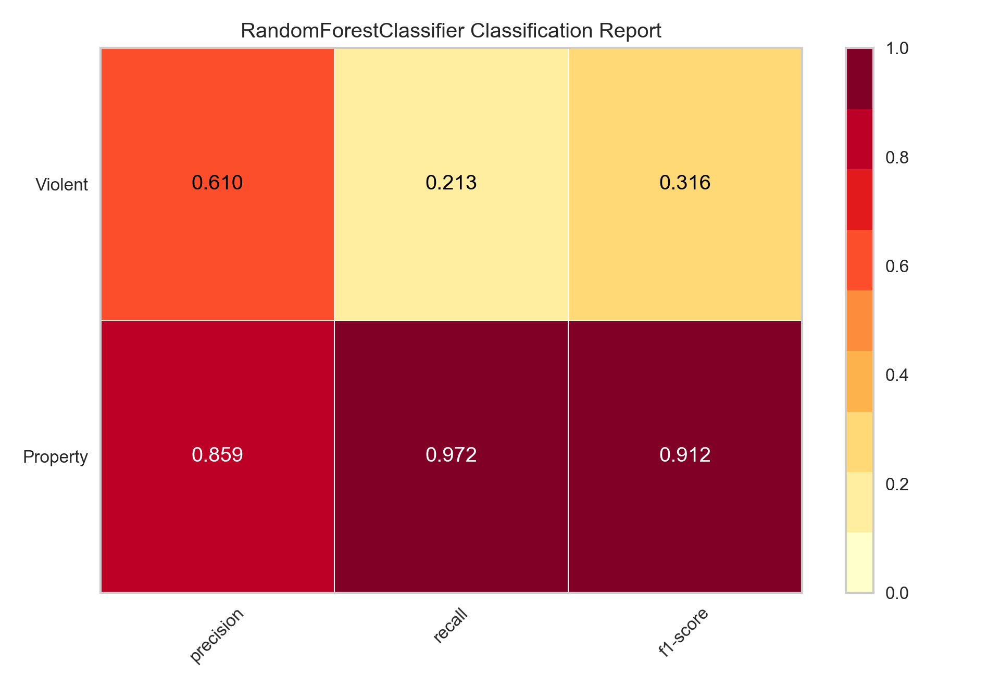

In [20]:
forest = classifier_graph(RandomForestClassifier(n_estimators=300,n_jobs = -1))

<IPython.core.display.Javascript object>


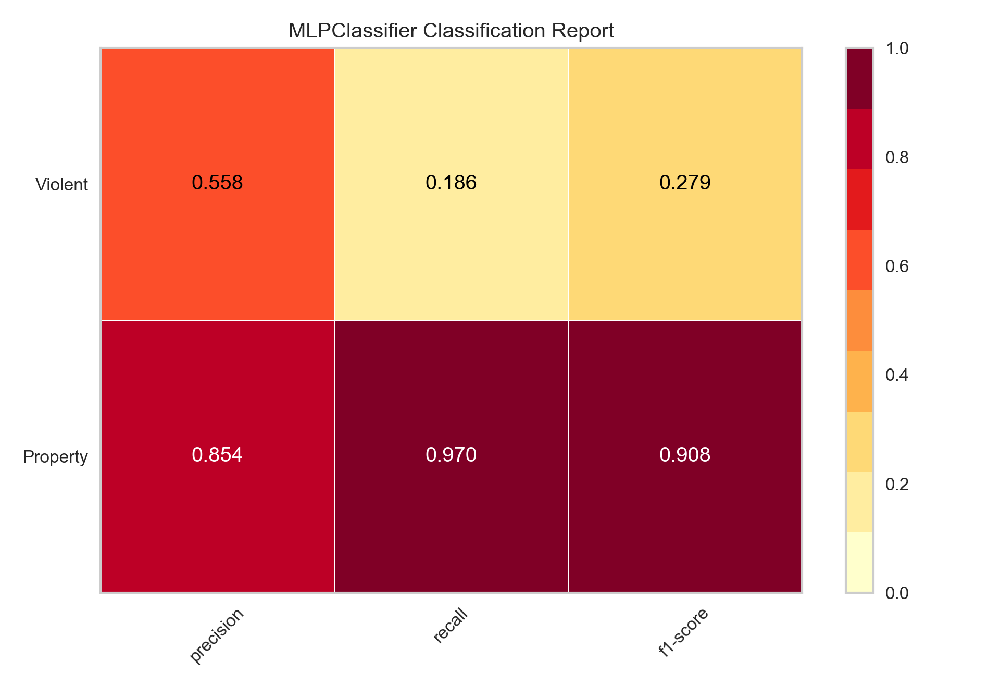

In [21]:
MLP = classifier_graph(MLPClassifier(hidden_layer_sizes = (100,),max_iter = 400))

## 2. Analysis with the target variable "ucr-rank" z

In [22]:
X_train, X_test, z_train, z_test = model_selection.train_test_split(X, z, test_size=0.2,random_state= 0)

In [23]:
scaler = StandardScaler()
#scaler =  MinMaxScaler()
#scaler = Normalizer()
X_train = scaler.fit(X_train).transform(X_train)
X_test = scaler.fit(X_test).transform(X_test)

In [24]:
def classifier_graph(classifier):
    classes = [1,2,3,4,5,6,7,8,9]
    model = classifier
    visualizer = ClassificationReport(model, classes=classes)
   


    visualizer.fit(X_train, z_train)  
    visualizer.score(X_test, z_test)  
    g = visualizer.poof()            

c:\users\franc\appdata\local\programs\python\python36\lib\site-packages\sklearn\linear_model\stochastic_gradient.py:128: FutureWarning: max_iter and tol parameters have been added in <class 'sklearn.linear_model.passive_aggressive.PassiveAggressiveClassifier'> in 0.19. If both are left unset, they default to max_iter=5 and tol=None. If tol is not None, max_iter defaults to max_iter=1000. From 0.21, default max_iter will be 1000, and default tol will be 1e-3.
  "and default tol will be 1e-3." % type(self), FutureWarning)
c:\users\franc\appdata\local\programs\python\python36\lib\site-packages\sklearn\metrics\classification.py:1135: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


<IPython.core.display.Javascript object>


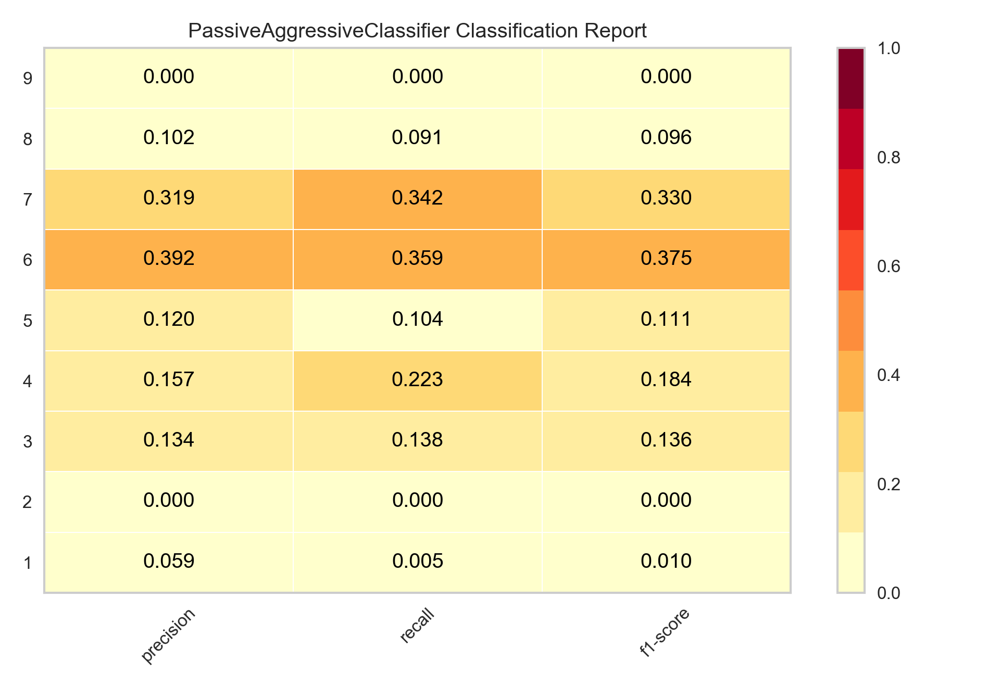

In [25]:
pa = classifier_graph(PassiveAggressiveClassifier())

c:\users\franc\appdata\local\programs\python\python36\lib\site-packages\sklearn\metrics\classification.py:1135: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


<IPython.core.display.Javascript object>


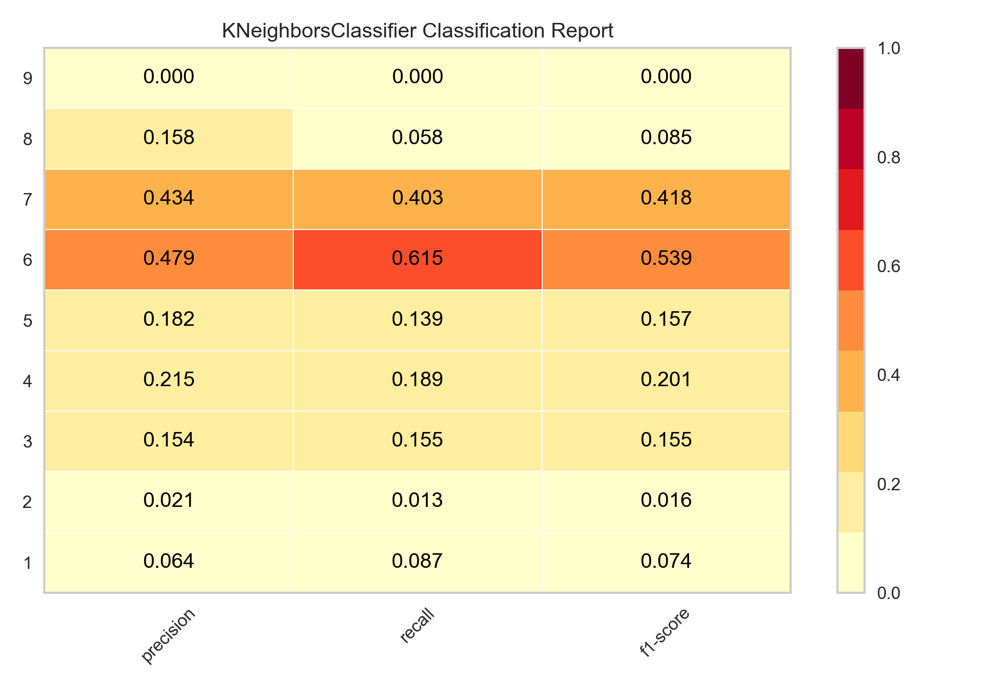

In [26]:
knn = classifier_graph(KNeighborsClassifier(n_jobs = -1))

c:\users\franc\appdata\local\programs\python\python36\lib\site-packages\sklearn\metrics\classification.py:1135: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


<IPython.core.display.Javascript object>


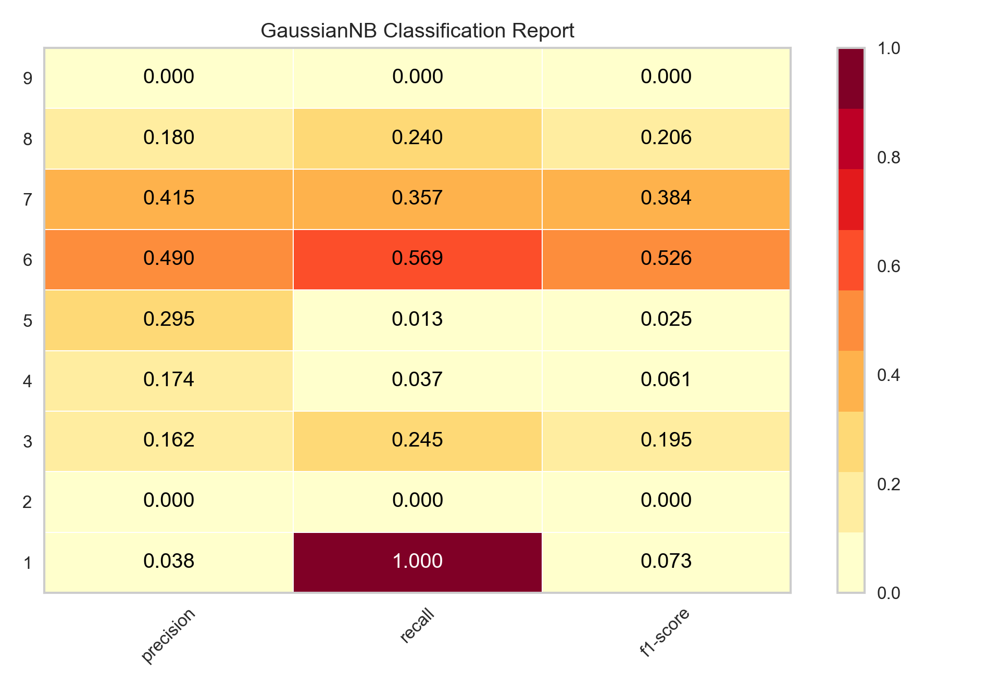

In [27]:
Naive_bayes = classifier_graph(GaussianNB())   

c:\users\franc\appdata\local\programs\python\python36\lib\site-packages\sklearn\metrics\classification.py:1135: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


<IPython.core.display.Javascript object>


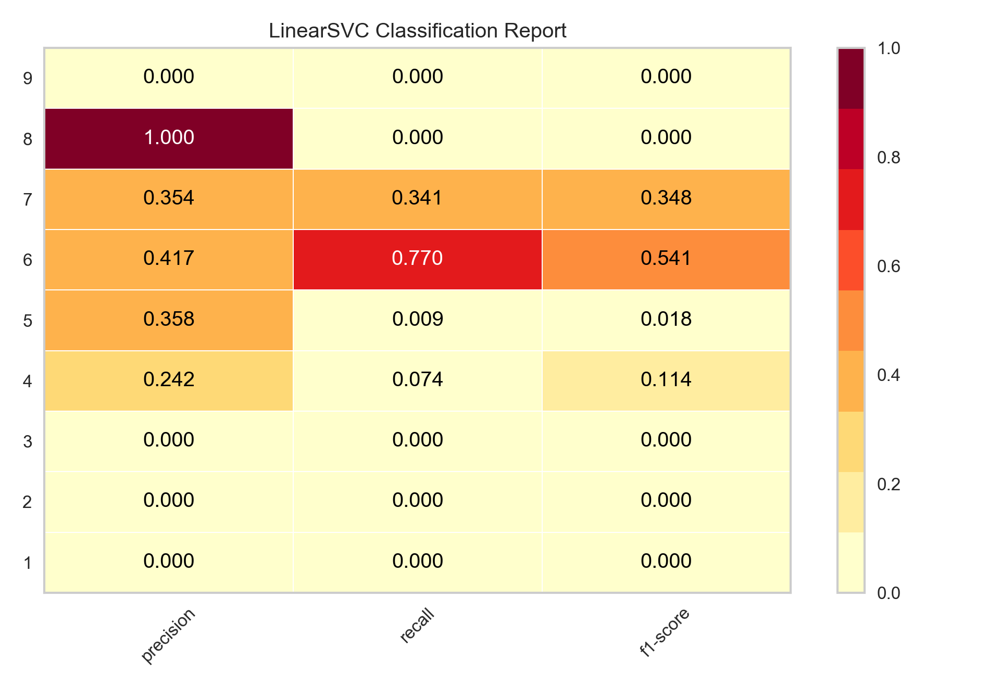

In [28]:
svc_linear = classifier_graph(LinearSVC())

c:\users\franc\appdata\local\programs\python\python36\lib\site-packages\sklearn\metrics\classification.py:1135: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


<IPython.core.display.Javascript object>


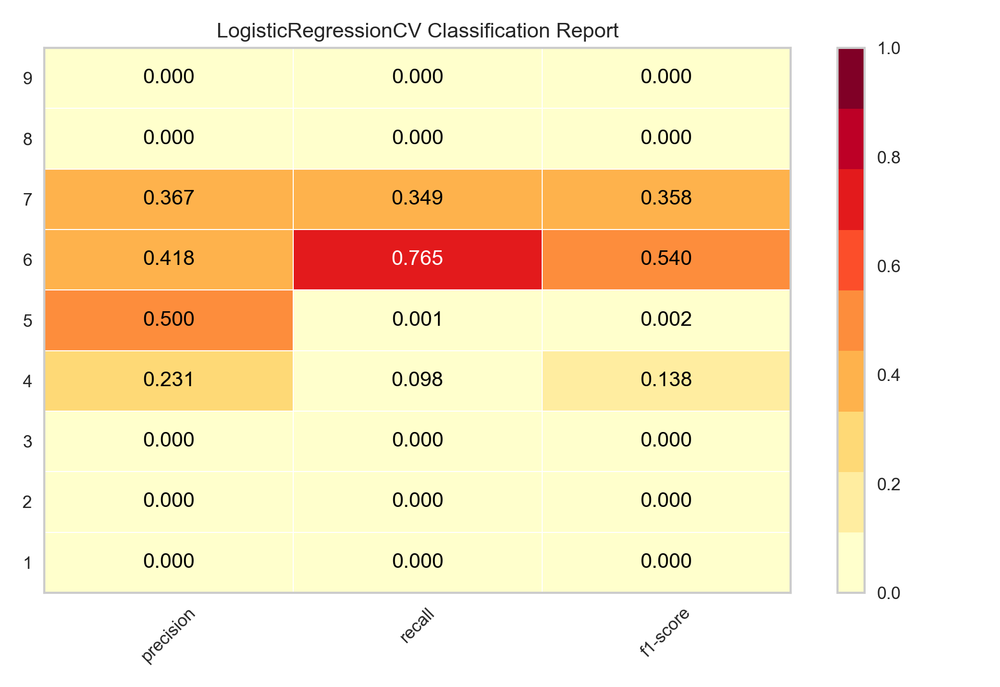

In [29]:
lgcv = classifier_graph(LogisticRegressionCV())

c:\users\franc\appdata\local\programs\python\python36\lib\site-packages\sklearn\linear_model\logistic.py:1228: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = -1.
  " = {}.".format(self.n_jobs))
c:\users\franc\appdata\local\programs\python\python36\lib\site-packages\sklearn\metrics\classification.py:1135: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


<IPython.core.display.Javascript object>


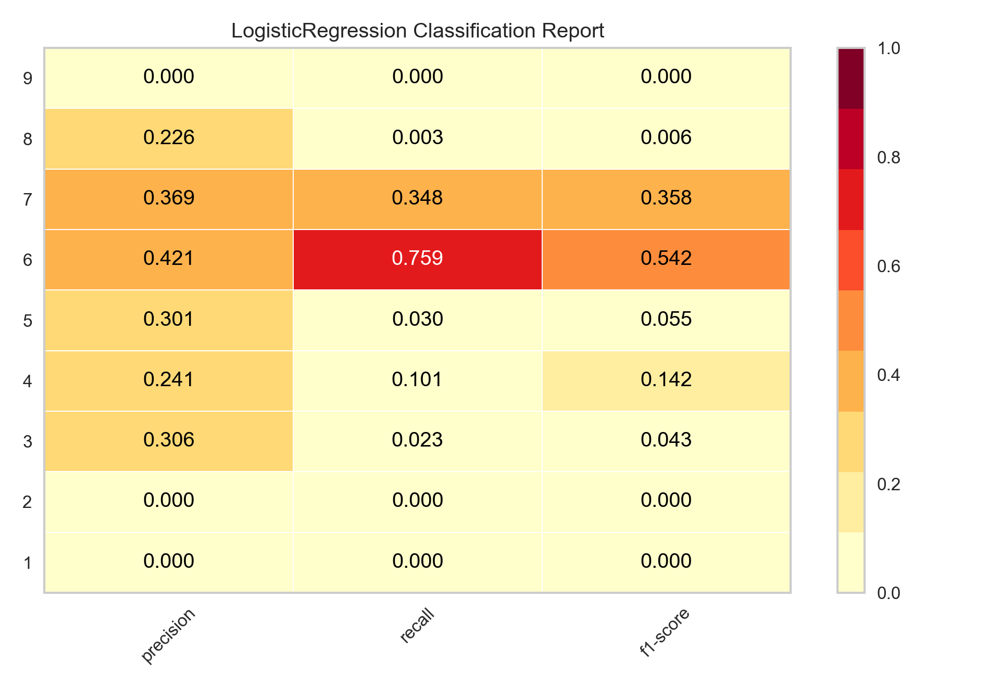

In [30]:
lg = classifier_graph(LogisticRegression(n_jobs = -1))

c:\users\franc\appdata\local\programs\python\python36\lib\site-packages\sklearn\linear_model\stochastic_gradient.py:128: FutureWarning: max_iter and tol parameters have been added in <class 'sklearn.linear_model.stochastic_gradient.SGDClassifier'> in 0.19. If both are left unset, they default to max_iter=5 and tol=None. If tol is not None, max_iter defaults to max_iter=1000. From 0.21, default max_iter will be 1000, and default tol will be 1e-3.
  "and default tol will be 1e-3." % type(self), FutureWarning)
c:\users\franc\appdata\local\programs\python\python36\lib\site-packages\sklearn\metrics\classification.py:1135: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


<IPython.core.display.Javascript object>


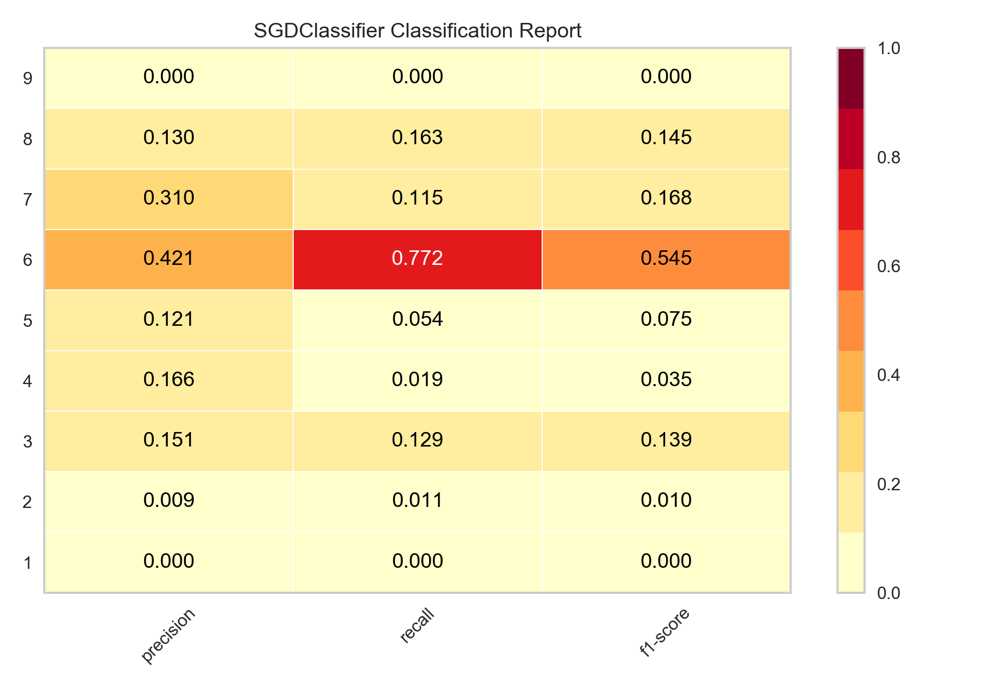

In [31]:
sgdc = classifier_graph(SGDClassifier())

c:\users\franc\appdata\local\programs\python\python36\lib\site-packages\sklearn\metrics\classification.py:1135: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


<IPython.core.display.Javascript object>


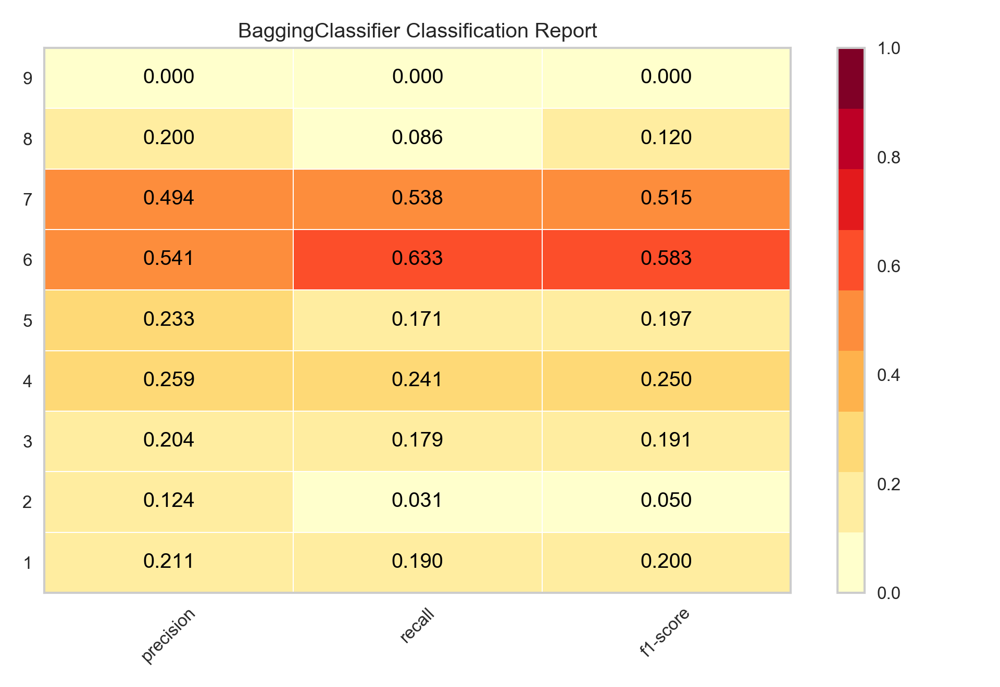

In [32]:
baggin = classifier_graph(BaggingClassifier())

<IPython.core.display.Javascript object>


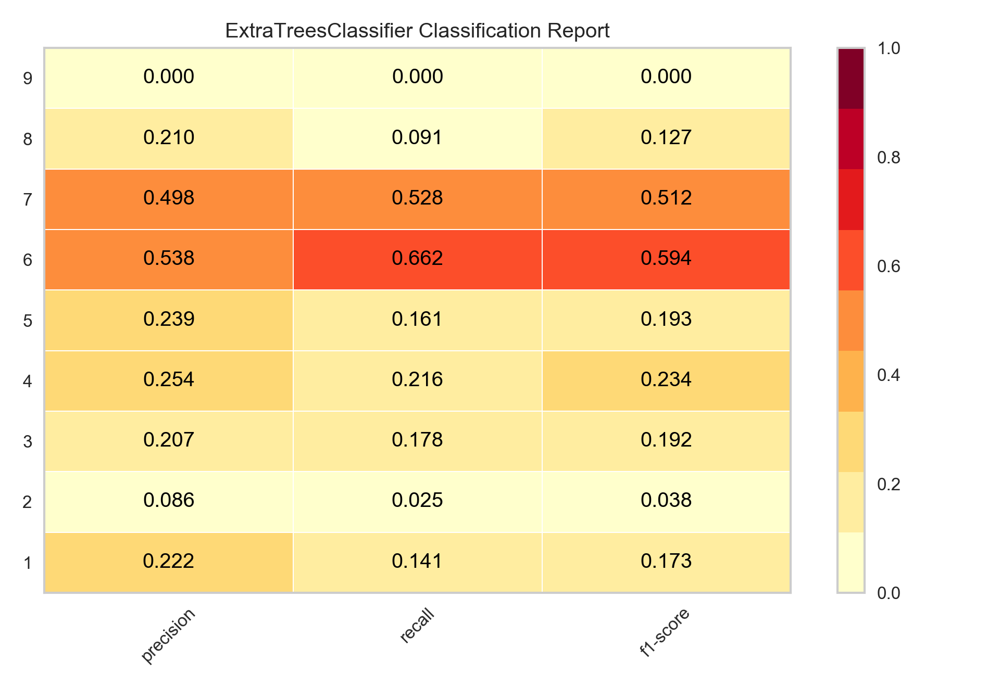

In [33]:
trees = classifier_graph(ExtraTreesClassifier(n_jobs = -1))

<IPython.core.display.Javascript object>


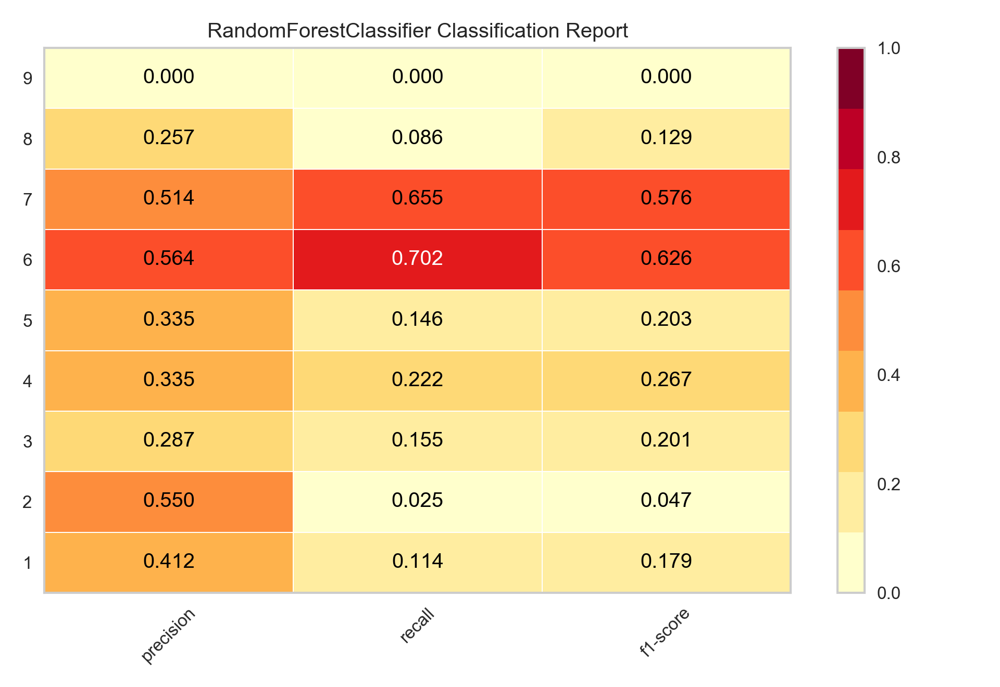

In [34]:
forest = classifier_graph(RandomForestClassifier(n_estimators=300, n_jobs = -1))

c:\users\franc\appdata\local\programs\python\python36\lib\site-packages\sklearn\metrics\classification.py:1135: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


<IPython.core.display.Javascript object>


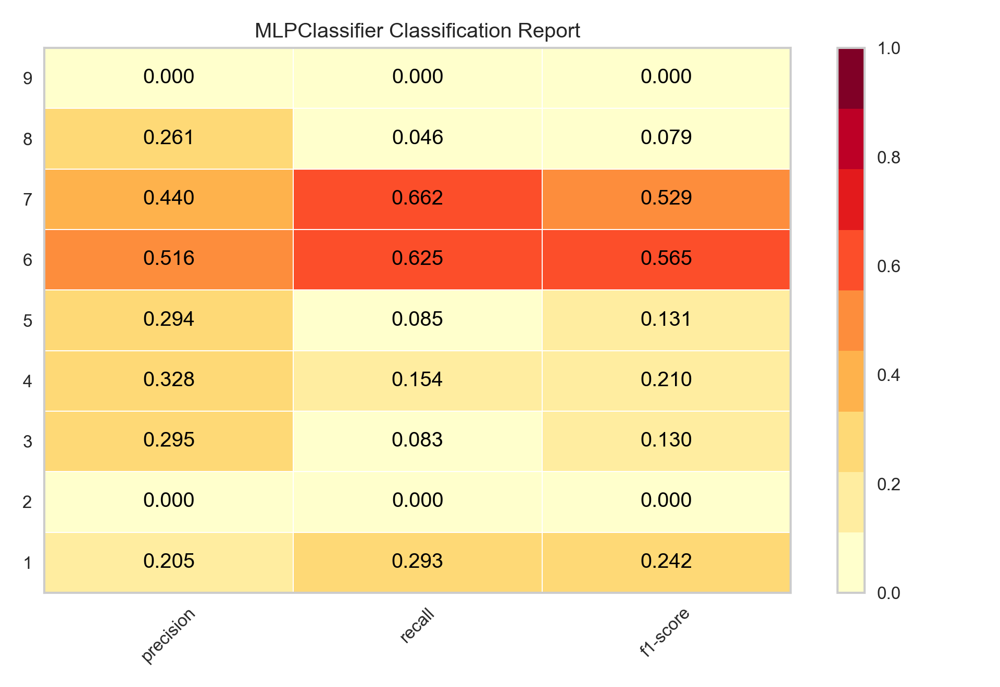

In [35]:
MLP = classifier_graph(MLPClassifier(hidden_layer_sizes = (100,),max_iter = 400))

## 3. Analysis with the target variable "ucr-rank" z with 3 classes:
3 is the most violent
1 is the least violent

Unpickle z again before running

In [36]:
X =  feat_var[0]
y =  feat_var[1] #y is "offense group"
z =  feat_var[2] # z is "ucr-rank"


X = X[["Hour", "SHIFT", "street", "minute", "month", "Day", "LATITUDE", "LONGITUDE", "Temperature","ANC", "PSA",
      "VOTING_PRECINCT", "BLOCK", "WARD", "datetime"]]


In [37]:
z_i = pd.Series(z)
z_i.value_counts()

6    102462
7     82325
4     26379
5     23033
8     22602
3     17686
2      2170
1       942
9       196
Name: ucr-rank, dtype: int64

In [38]:
def new_cat(z):
    
    new_cat = []
    for i in z:
        if i >= 1 and i < 5:
            i = 3
        elif i == 7:
            i = 2
        elif i == 8:
            i = 2
        else:
            i = 1
        new_cat.append(i)
    z = pd.Series(new_cat)
    return z

In [39]:
z = new_cat(z)

In [40]:
z_j = pd.Series(z)
z_j.value_counts()

1    125691
2    104927
3     47177
dtype: int64

In [41]:
X_train, X_test, z_train, z_test = model_selection.train_test_split(X, z, test_size=0.2,random_state= 0)

scaler = StandardScaler()
#scaler =  MinMaxScaler()
#scaler = Normalizer()
X_train = scaler.fit(X_train).transform(X_train)
X_test = scaler.fit(X_test).transform(X_test)

In [42]:
def classifier_graph(classifier):
    classes = [1,2,3]
    model = classifier
    visualizer = ClassificationReport(model, classes=classes)

    visualizer.fit(X_train, z_train)  
    visualizer.score(X_test, z_test)  
    g = visualizer.poof()            

c:\users\franc\appdata\local\programs\python\python36\lib\site-packages\sklearn\linear_model\stochastic_gradient.py:128: FutureWarning: max_iter and tol parameters have been added in <class 'sklearn.linear_model.passive_aggressive.PassiveAggressiveClassifier'> in 0.19. If both are left unset, they default to max_iter=5 and tol=None. If tol is not None, max_iter defaults to max_iter=1000. From 0.21, default max_iter will be 1000, and default tol will be 1e-3.
  "and default tol will be 1e-3." % type(self), FutureWarning)


<IPython.core.display.Javascript object>


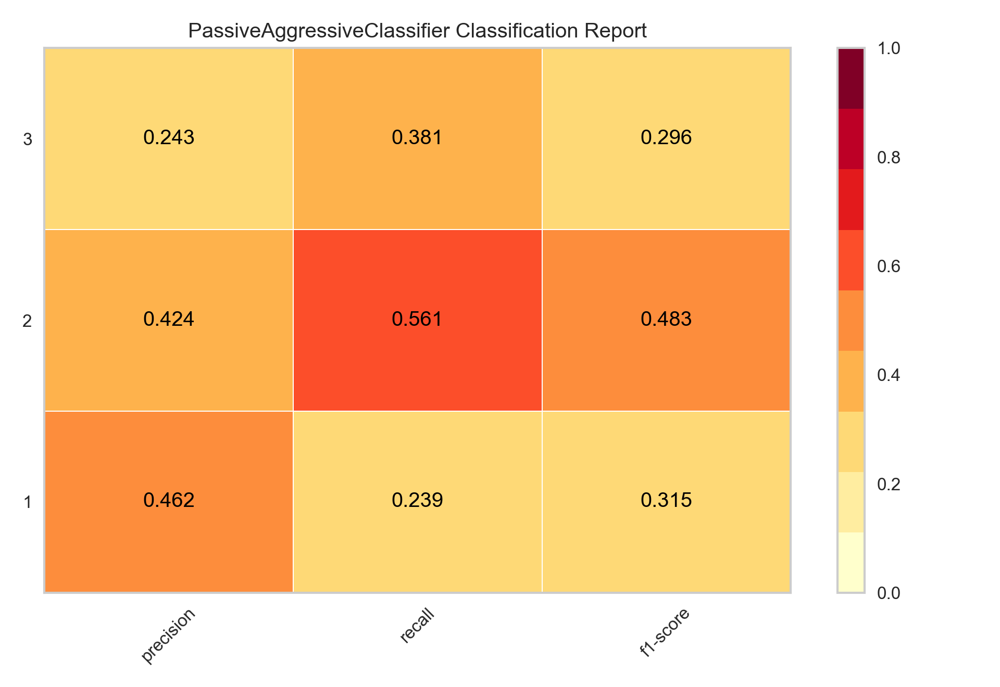

In [43]:
pa = classifier_graph(PassiveAggressiveClassifier())

<IPython.core.display.Javascript object>


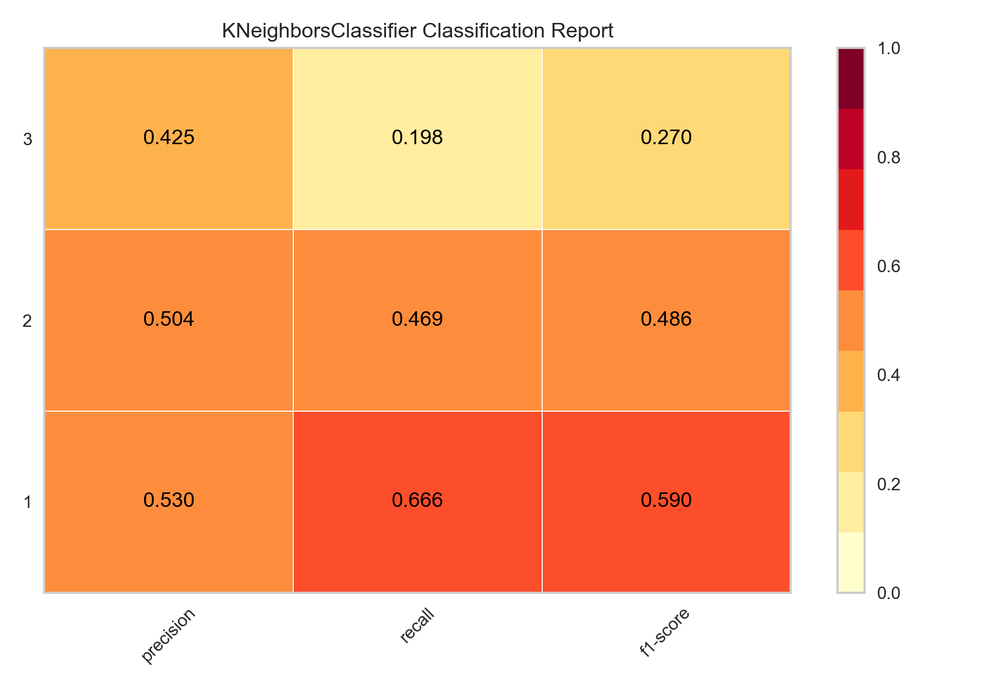

In [44]:
knn = classifier_graph(KNeighborsClassifier(n_jobs = -1))

<IPython.core.display.Javascript object>


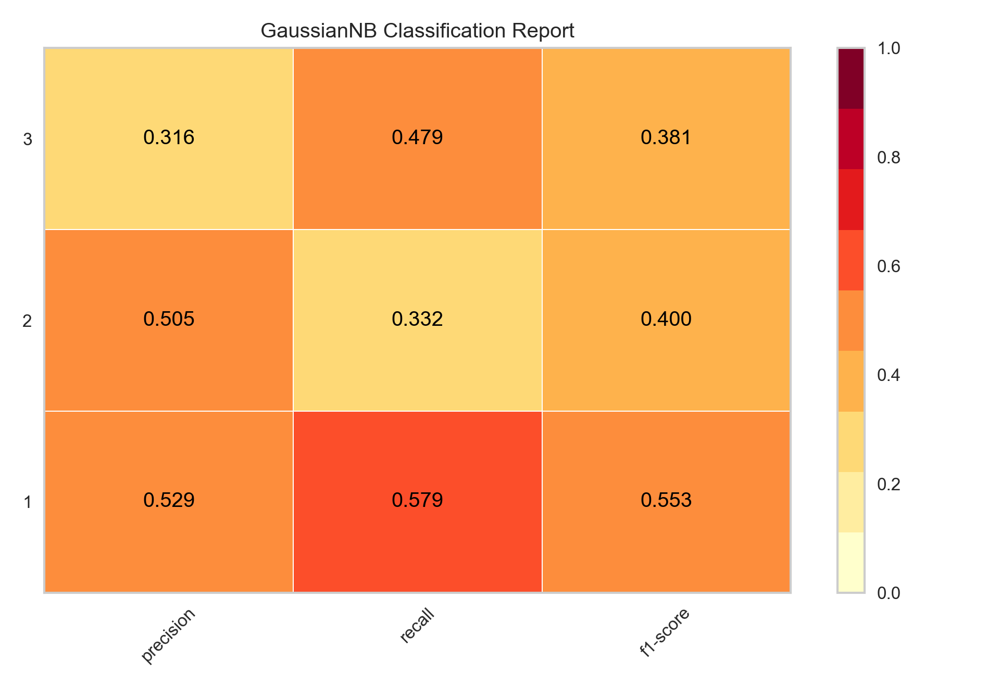

In [45]:
Naive_bayes = classifier_graph(GaussianNB())

<IPython.core.display.Javascript object>


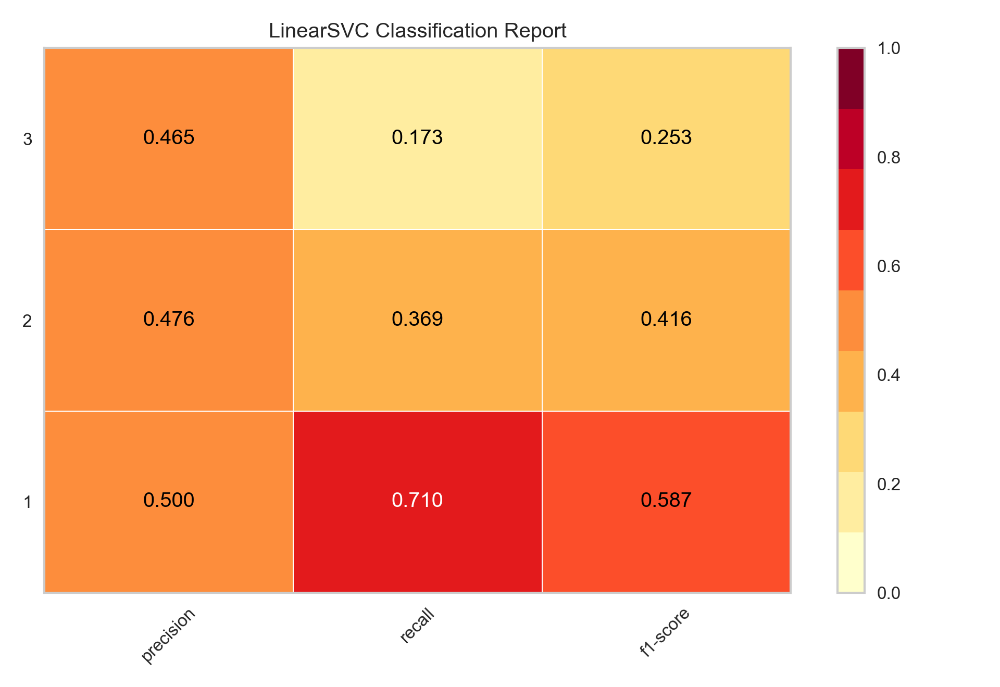

In [46]:
svc_linear = classifier_graph(LinearSVC())

<IPython.core.display.Javascript object>


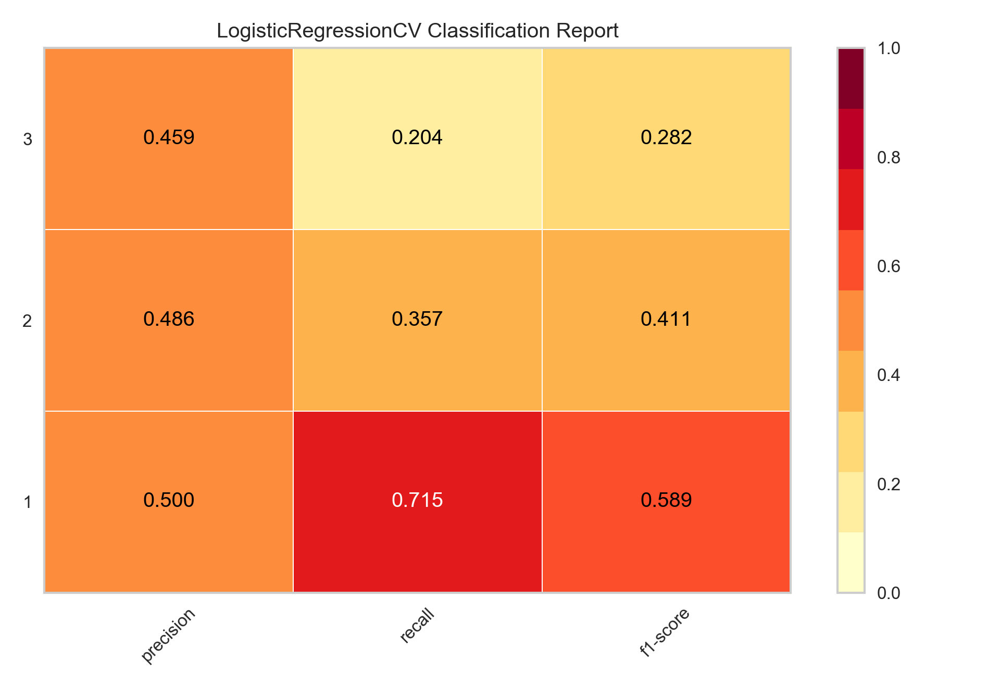

In [47]:
lgcv = classifier_graph(LogisticRegressionCV(n_jobs = -1))

c:\users\franc\appdata\local\programs\python\python36\lib\site-packages\sklearn\linear_model\logistic.py:1228: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = -1.
  " = {}.".format(self.n_jobs))


<IPython.core.display.Javascript object>


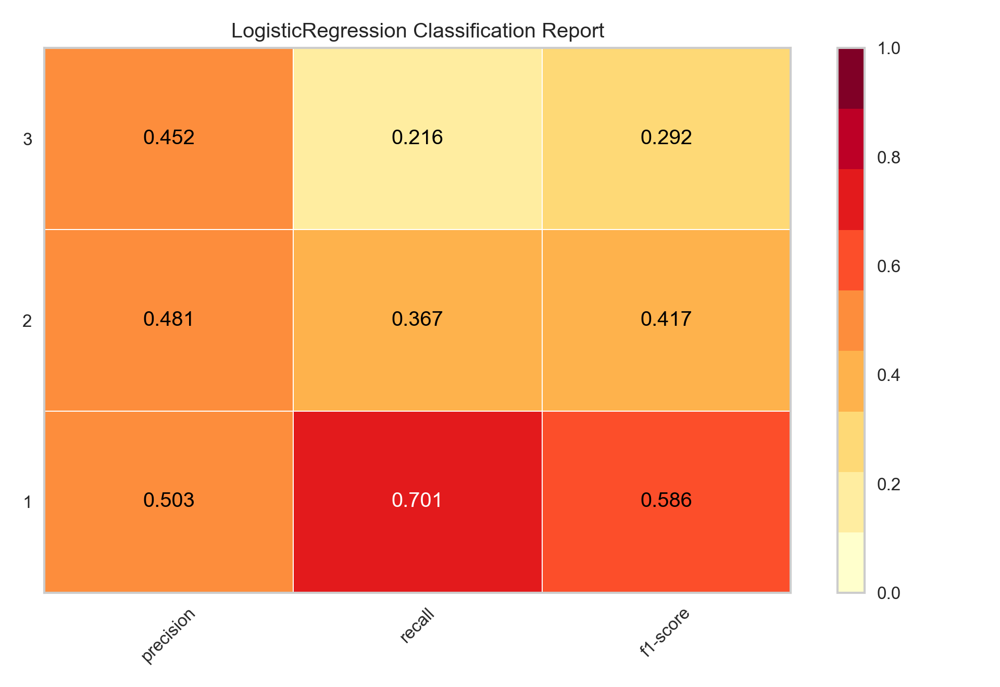

In [48]:
lg = classifier_graph(LogisticRegression(n_jobs = -1))

c:\users\franc\appdata\local\programs\python\python36\lib\site-packages\sklearn\linear_model\stochastic_gradient.py:128: FutureWarning: max_iter and tol parameters have been added in <class 'sklearn.linear_model.stochastic_gradient.SGDClassifier'> in 0.19. If both are left unset, they default to max_iter=5 and tol=None. If tol is not None, max_iter defaults to max_iter=1000. From 0.21, default max_iter will be 1000, and default tol will be 1e-3.
  "and default tol will be 1e-3." % type(self), FutureWarning)


<IPython.core.display.Javascript object>


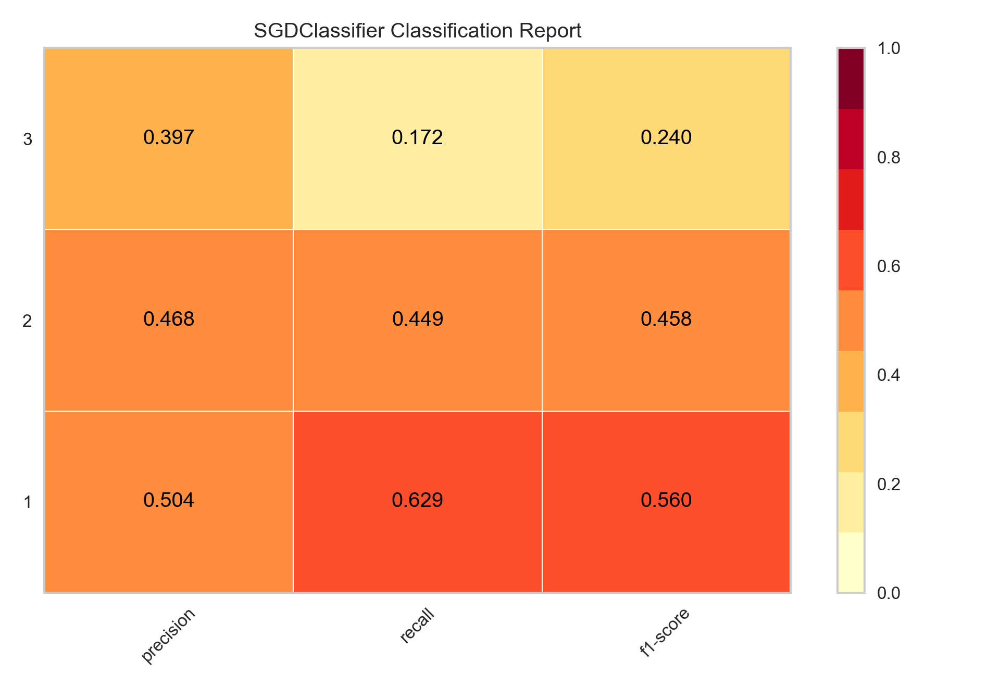

In [49]:
sgdc = classifier_graph(SGDClassifier())

<IPython.core.display.Javascript object>


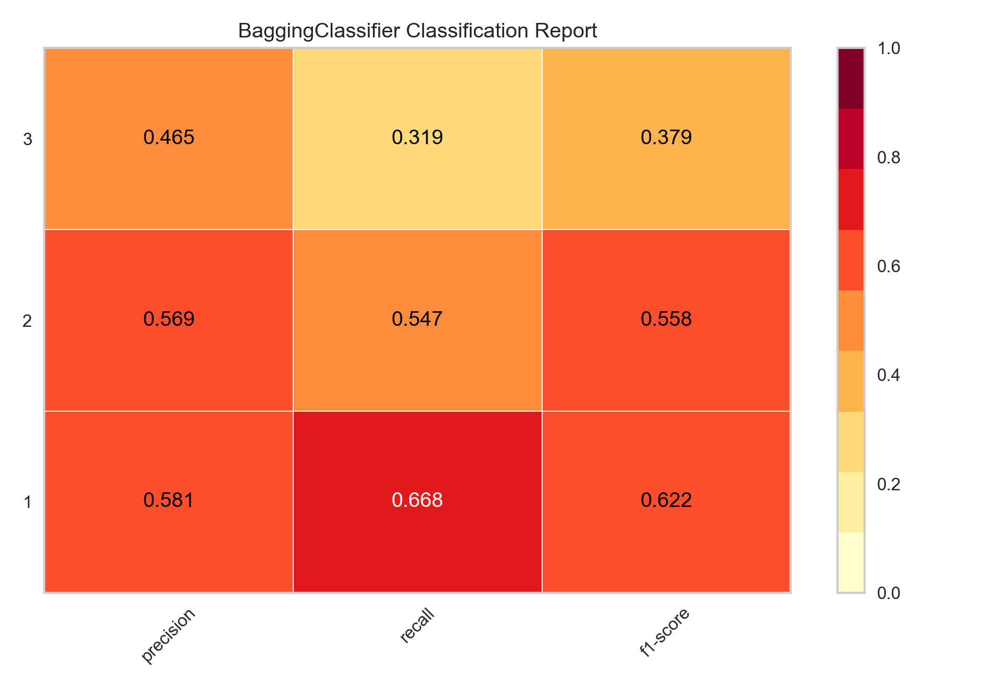

In [50]:
baggin = classifier_graph(BaggingClassifier(n_jobs = -1))

<IPython.core.display.Javascript object>


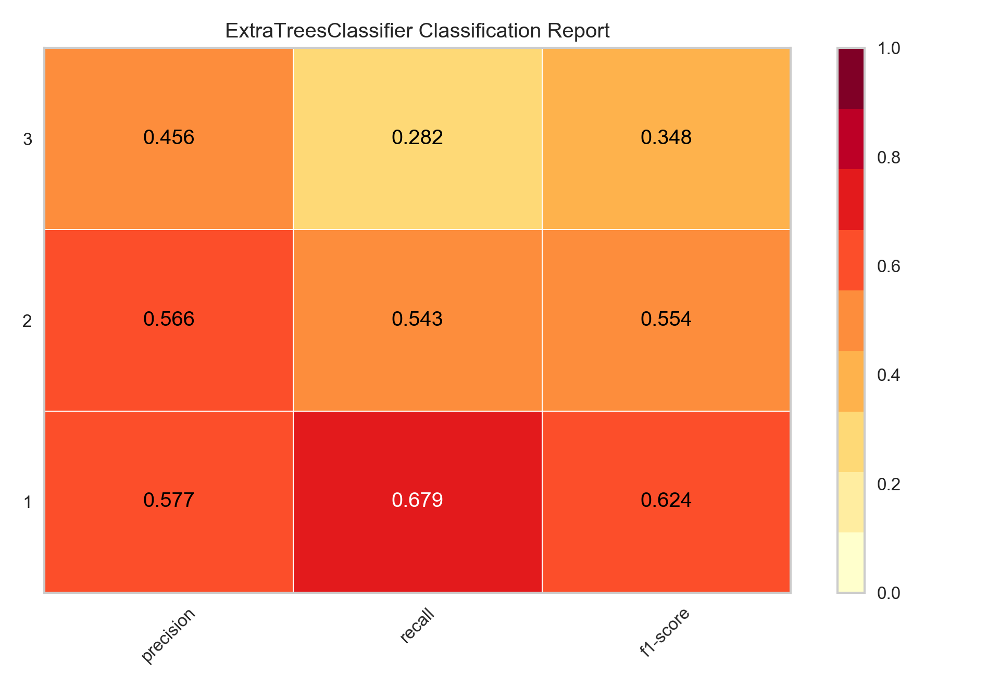

In [51]:
trees = classifier_graph(ExtraTreesClassifier(n_jobs = -1))

<IPython.core.display.Javascript object>


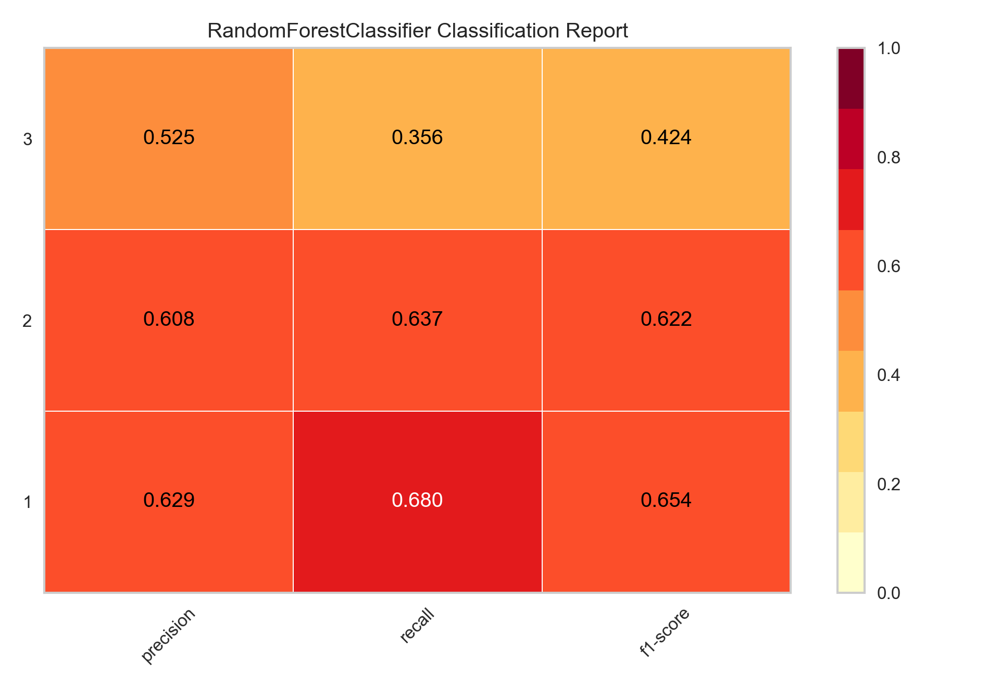

In [52]:
forest = classifier_graph(RandomForestClassifier(n_estimators=300,n_jobs = -1 ))

<IPython.core.display.Javascript object>


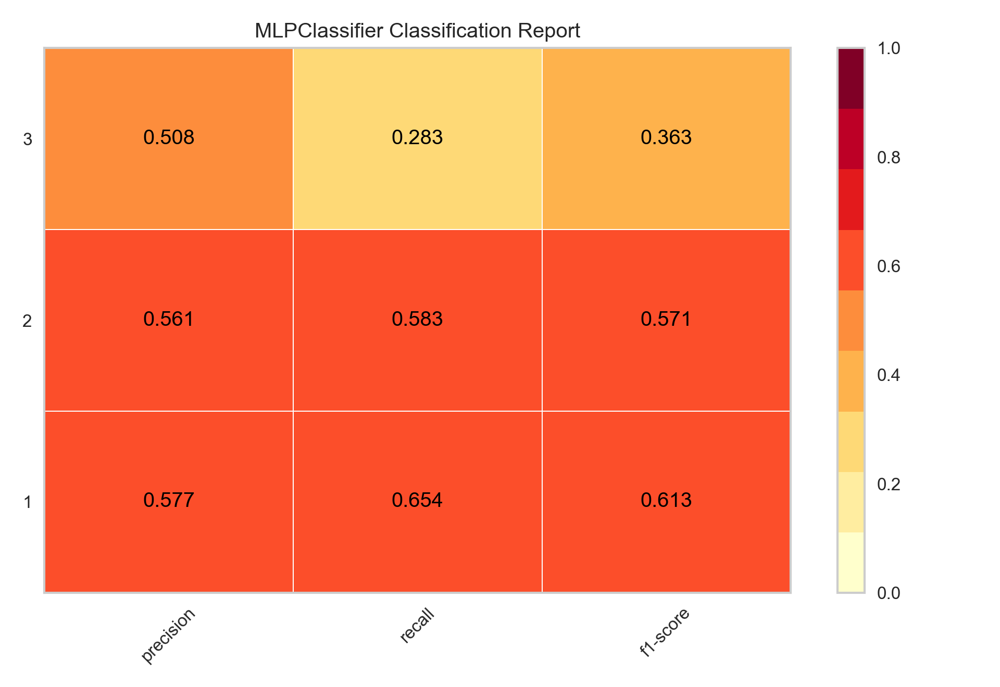

In [53]:
MLP = classifier_graph(MLPClassifier(hidden_layer_sizes = (100,),max_iter = 400))

## 4. Analysis with the target variable "ucr-rank" z with 2 classes, including car theft into violent crime, which will be of concern:

Reopen pickled file first:

In [54]:
X =  feat_var[0]
y =  feat_var[1] #y is "offense group"
z =  feat_var[2] # z is "ucr-rank"


X = X[["Hour", "SHIFT", "street", "minute", "month", "Day", "LATITUDE", "LONGITUDE", "Temperature","ANC", "PSA",
      "VOTING_PRECINCT", "BLOCK", "WARD", "datetime"]]


In [55]:
z_i = pd.Series(z)
z_i.value_counts()

6    102462
7     82325
4     26379
5     23033
8     22602
3     17686
2      2170
1       942
9       196
Name: ucr-rank, dtype: int64

In [56]:
def new_cat2(z):
    new_cat = []
    for i in z:
        if i >= 1 and i < 5:
            i = 2
        elif i == 7:
            i = 2
        elif i == 8:
            i = 2
        else:
            i = 1
        new_cat.append(i)
    z = pd.Series(new_cat)
    return z

In [57]:
z = new_cat2(z)

In [58]:
zi = pd.Series(z)

In [59]:
zi.value_counts()

2    152104
1    125691
dtype: int64

In [60]:
X_train, X_test, z_train, z_test = model_selection.train_test_split(X, z, test_size=0.2,random_state= 0)

scaler = StandardScaler()
#scaler =  MinMaxScaler()
#scaler = Normalizer()
X_train = scaler.fit(X_train).transform(X_train)
X_test = scaler.fit(X_test).transform(X_test)

In [61]:
def classifier_graph(classifier):
    classes = [1,2]  # 1 non violent, 2 Violent(car theft included)
    model = classifier
    visualizer = ClassificationReport(model, classes=classes)

    visualizer.fit(X_train, z_train)  
    visualizer.score(X_test, z_test)  
    g = visualizer.poof()         

c:\users\franc\appdata\local\programs\python\python36\lib\site-packages\sklearn\linear_model\stochastic_gradient.py:128: FutureWarning: max_iter and tol parameters have been added in <class 'sklearn.linear_model.passive_aggressive.PassiveAggressiveClassifier'> in 0.19. If both are left unset, they default to max_iter=5 and tol=None. If tol is not None, max_iter defaults to max_iter=1000. From 0.21, default max_iter will be 1000, and default tol will be 1e-3.
  "and default tol will be 1e-3." % type(self), FutureWarning)


<IPython.core.display.Javascript object>


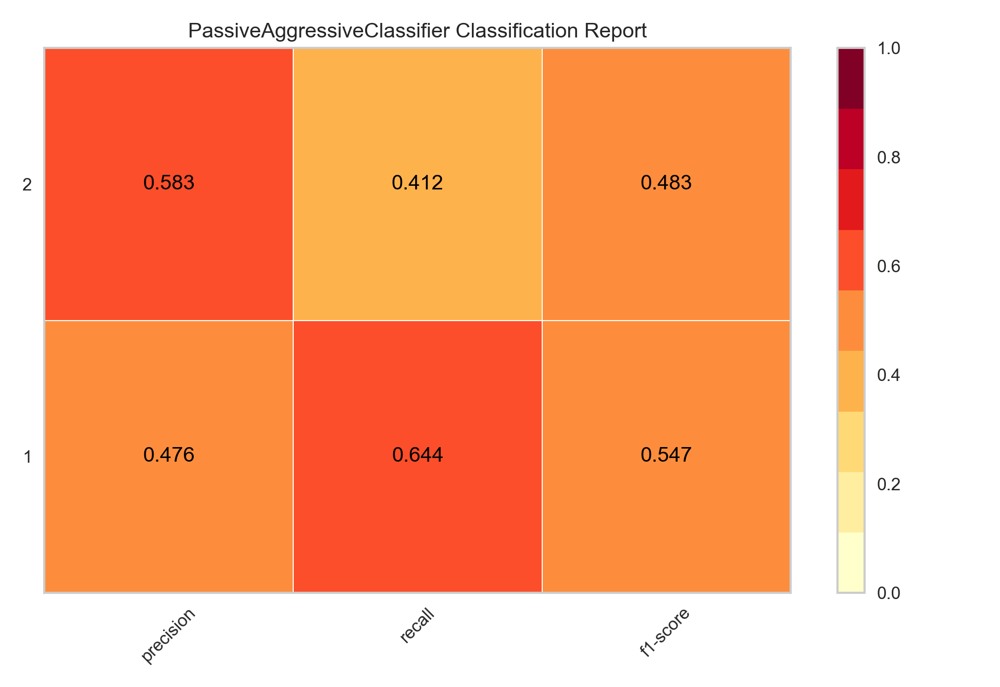

In [62]:
pa = classifier_graph(PassiveAggressiveClassifier())

<IPython.core.display.Javascript object>


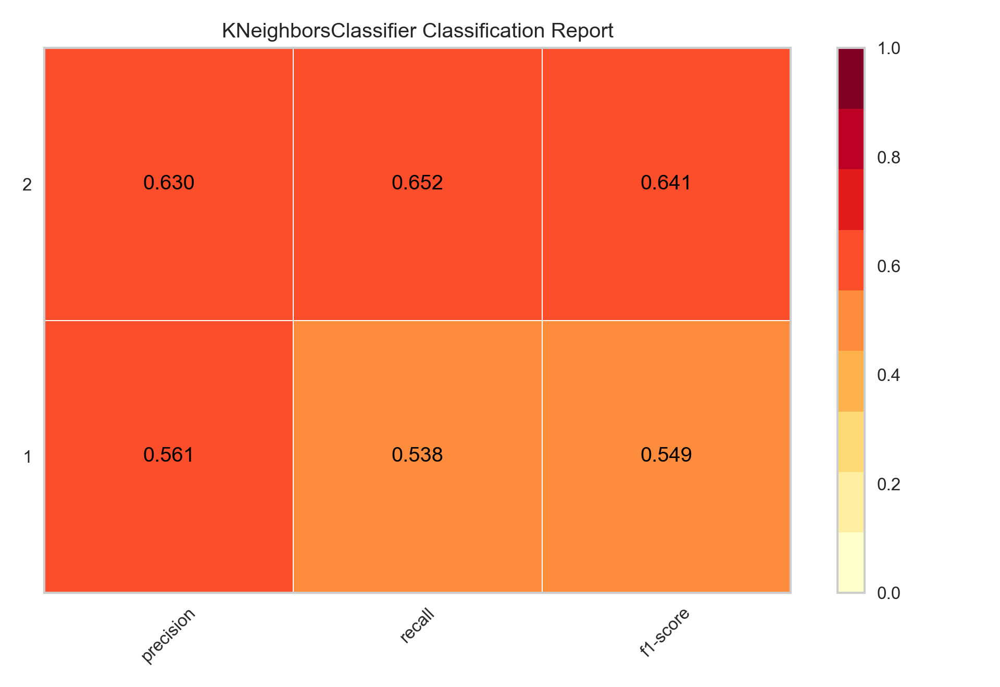

In [63]:
knn = classifier_graph(KNeighborsClassifier(n_jobs = -1))

<IPython.core.display.Javascript object>


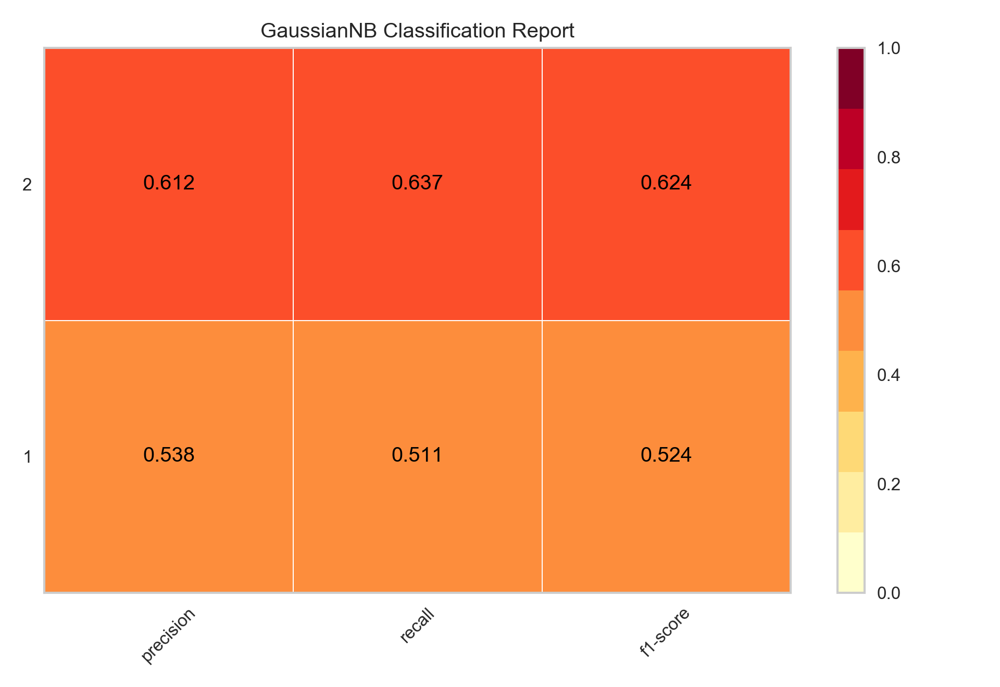

In [64]:
Naive_bayes = classifier_graph(GaussianNB())

<IPython.core.display.Javascript object>


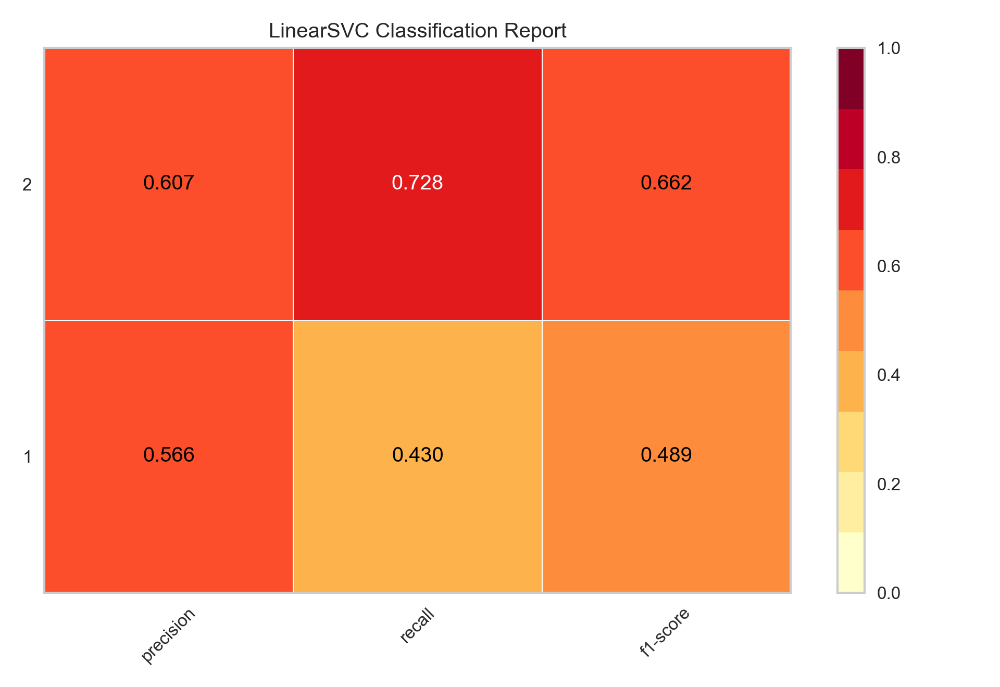

In [66]:
svc_linear = classifier_graph(LinearSVC())

<IPython.core.display.Javascript object>


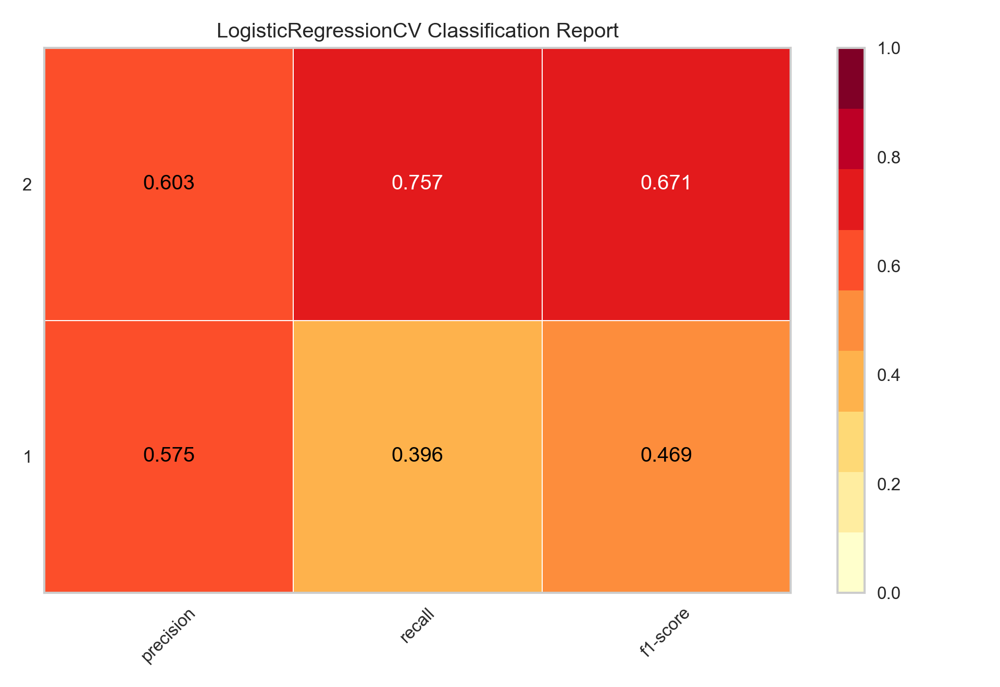

In [67]:
lgcv = classifier_graph(LogisticRegressionCV(n_jobs = -1))

c:\users\franc\appdata\local\programs\python\python36\lib\site-packages\sklearn\linear_model\logistic.py:1228: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = -1.
  " = {}.".format(self.n_jobs))


<IPython.core.display.Javascript object>


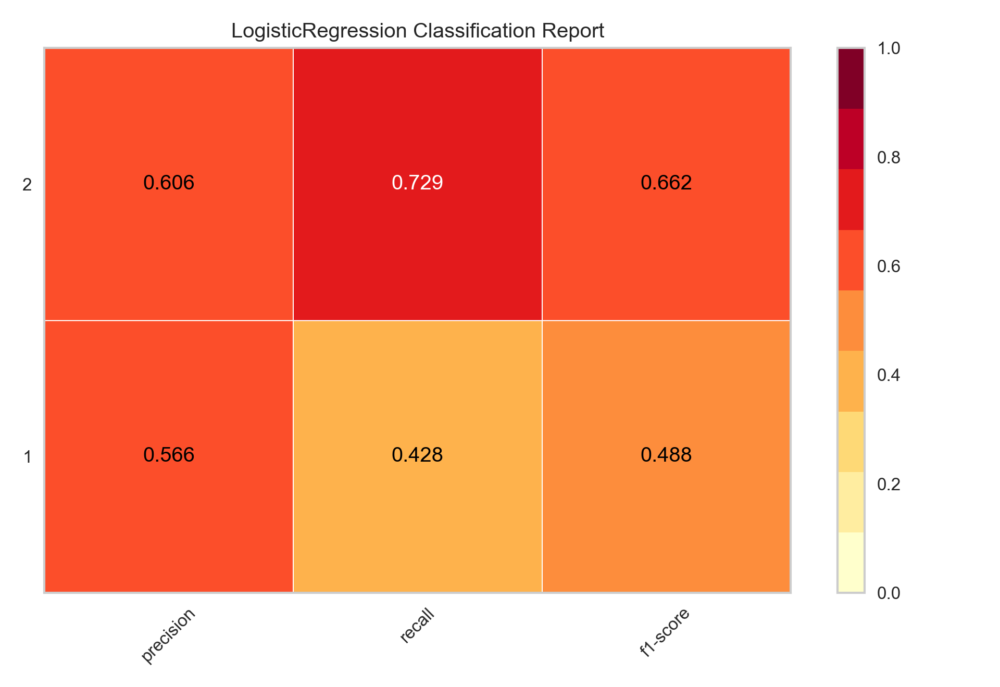

In [68]:
lg = classifier_graph(LogisticRegression(n_jobs = -1))

c:\users\franc\appdata\local\programs\python\python36\lib\site-packages\sklearn\linear_model\stochastic_gradient.py:128: FutureWarning: max_iter and tol parameters have been added in <class 'sklearn.linear_model.stochastic_gradient.SGDClassifier'> in 0.19. If both are left unset, they default to max_iter=5 and tol=None. If tol is not None, max_iter defaults to max_iter=1000. From 0.21, default max_iter will be 1000, and default tol will be 1e-3.
  "and default tol will be 1e-3." % type(self), FutureWarning)


<IPython.core.display.Javascript object>


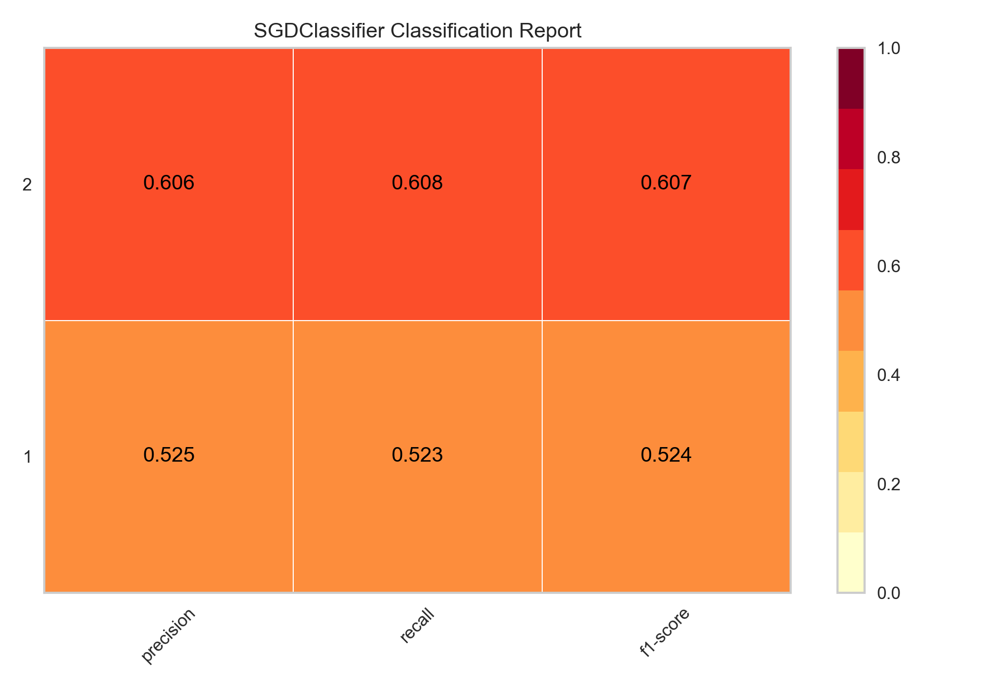

In [69]:
sgdc = classifier_graph(SGDClassifier(n_jobs = -1))

<IPython.core.display.Javascript object>


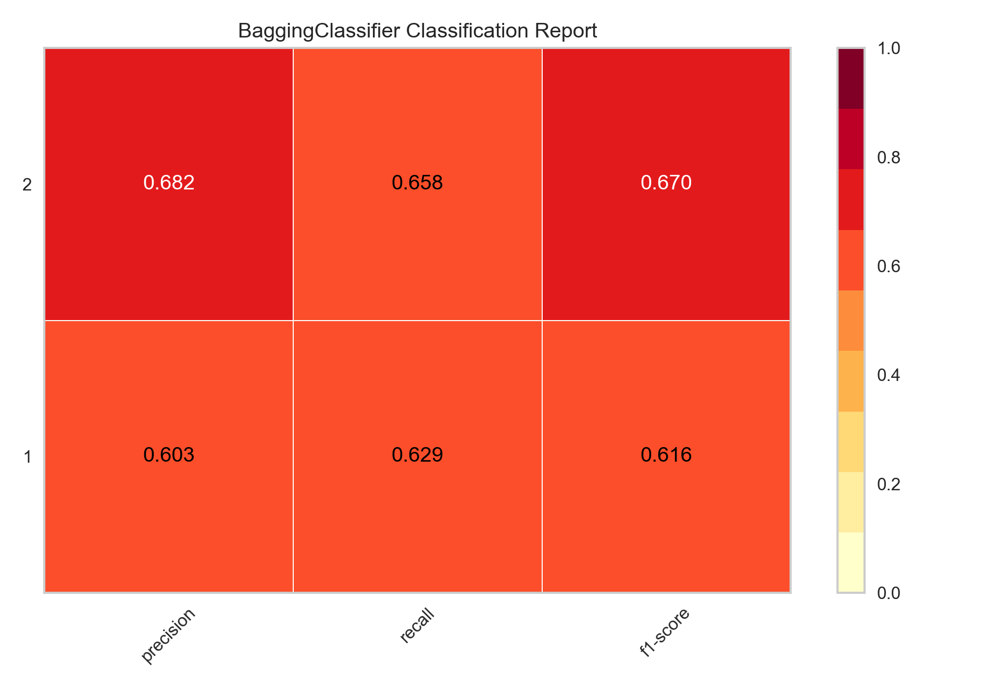

In [70]:
baggin = classifier_graph(BaggingClassifier(n_jobs = -1))

<IPython.core.display.Javascript object>


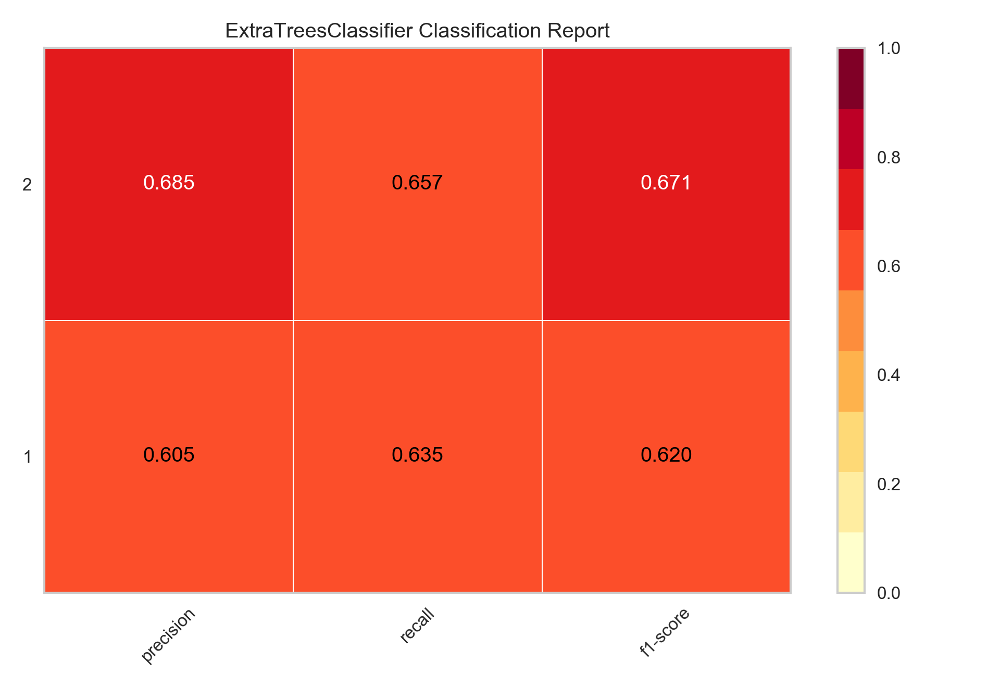

In [71]:
trees = classifier_graph(ExtraTreesClassifier(n_jobs = -1))

<IPython.core.display.Javascript object>


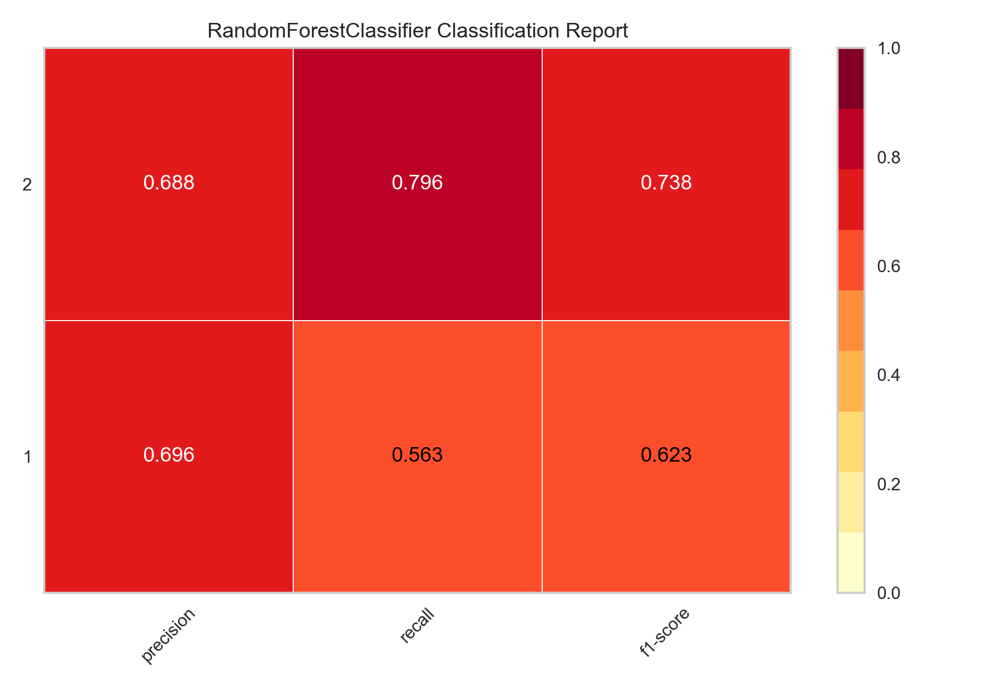

In [72]:
forest = classifier_graph(RandomForestClassifier(n_estimators=300,n_jobs = -1 ))

<IPython.core.display.Javascript object>


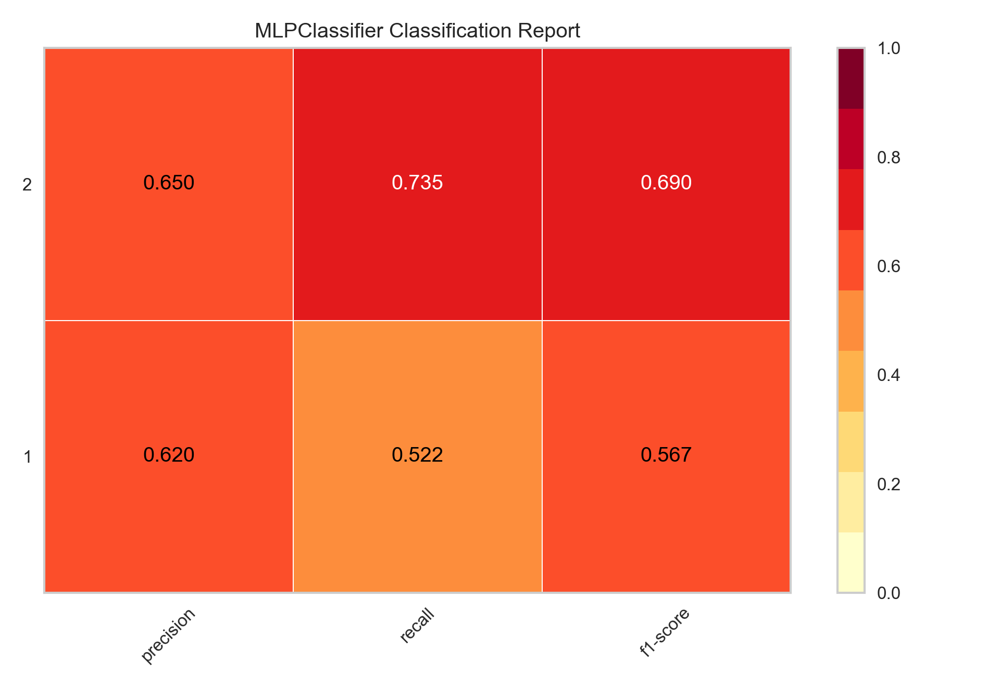

In [73]:
MLP = classifier_graph(MLPClassifier(hidden_layer_sizes = (100,),max_iter = 400))